# Загрузка данных

In [1]:
import numpy as np
import pandas as pd

import os
import sys


In [2]:
# Устанавливаем в окружение активного ядра
!{sys.executable} -m pip install kagglehub

In [3]:
# Пробуем импортировать и скачать данные
try:
    import kagglehub
    print("Скачивание данных через kagglehub...")
    path = kagglehub.competition_download('scintillation-detector')
except ModuleNotFoundError:
    print("Ошибка: модуль 'kagglehub' не установлен. Используется локальная папка.")
    path = "."
except Exception as e:
    print(f"Произошла ошибка при скачивании: {e}. Используется локальная папка.")
    path = "."

print(f"Текущий путь к данным: {path}")


Скачивание данных через kagglehub...
Текущий путь к данным: /home/itj/.cache/kagglehub/competitions/scintillation-detector


In [4]:
# Смотрим список файлов в скачанной директории
if os.path.exists(path):
    files = os.listdir(path)
    print("Файлы в директории:", files)
else:
    print("Путь не найден!")


Файлы в директории: ['submission_final.csv', 'Description.pdf', 'test-dataset.ipynb', 'submission.csv', 'Run200_Wave_0_1.txt']


In [5]:
# Data loading

dataset = pd.read_csv(path + '/' + 'Run200_Wave_0_1.txt', sep=' ', header=None, skipinitialspace=True)

In [6]:
dataset.head()

,0,1,2,3,4,5,6,7,8,9,...,495,496,497,498,499,500,501,502,503,504
0,2890276,357,113,500,14820,14823,14824,14822,14818,14820,...,14822,14815,14815,14817,14819,14820,14822,14820,14819,NaN
1,4928764,740,359,500,14820,14822,14820,14826,14824,14822,...,14817,14824,14822,14824,14819,14820,14819,14822,14820,NaN
2,9630204,162,499,500,14820,14820,14822,14825,14820,14824,...,14821,14820,14820,14818,14821,14823,14820,14820,14821,NaN
3,15798632,841,123,500,14828,14822,14818,14824,14824,14822,...,14826,14822,14821,14820,14828,14820,14822,14823,14822,NaN
4,20637296,412,348,500,14823,14815,14823,14821,14827,14820,...,14820,14823,14828,14824,14820,14824,14824,14822,14825,NaN


In [7]:
# согласно заданию удаляем столбцы содержащие метаданные оборудования
dataset = dataset.drop([0, 1, 2, 3, 504], axis='columns')
dataset.columns = list(range(500))
dataset.head()

,0,1,2,3,4,5,6,7,8,9,...,490,491,492,493,494,495,496,497,498,499
0,14820,14823,14824,14822,14818,14820,14824,14822,14820,14820,...,14828,14822,14815,14815,14817,14819,14820,14822,14820,14819
1,14820,14822,14820,14826,14824,14822,14820,14822,14823,14821,...,14828,14817,14824,14822,14824,14819,14820,14819,14822,14820
2,14820,14820,14822,14825,14820,14824,14824,14819,14823,14824,...,14820,14821,14820,14820,14818,14821,14823,14820,14820,14821
3,14828,14822,14818,14824,14824,14822,14820,14822,14824,14820,...,14824,14826,14822,14821,14820,14828,14820,14822,14823,14822
4,14823,14815,14823,14821,14827,14820,14823,14824,14816,14821,...,14820,14820,14823,14828,14824,14820,14824,14824,14822,14825


In [8]:
dataset.shape

(23479, 500)

In [9]:
print("Количество пропусков в датасете:", dataset.isna().sum().sum())


Количество пропусков в датасете: 0


# Графика пика

Text(0, 0.5, 'bit ADC')

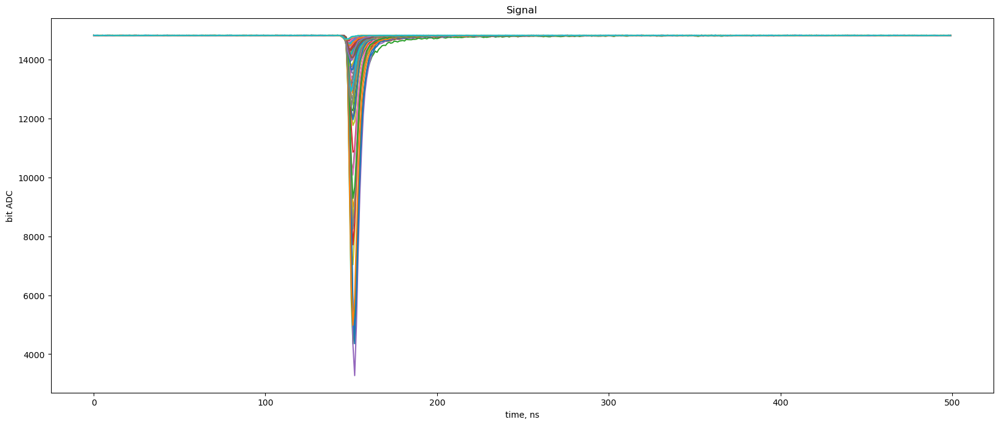

In [10]:
N=range(0,100)
ax = dataset.T[N][0:500].plot(title='Signal' ,legend=None,figsize=(20,8))
ax.set_xlabel("time, ns")
ax.set_ylabel("bit ADC")

Text(0, 0.5, 'bit ADC')

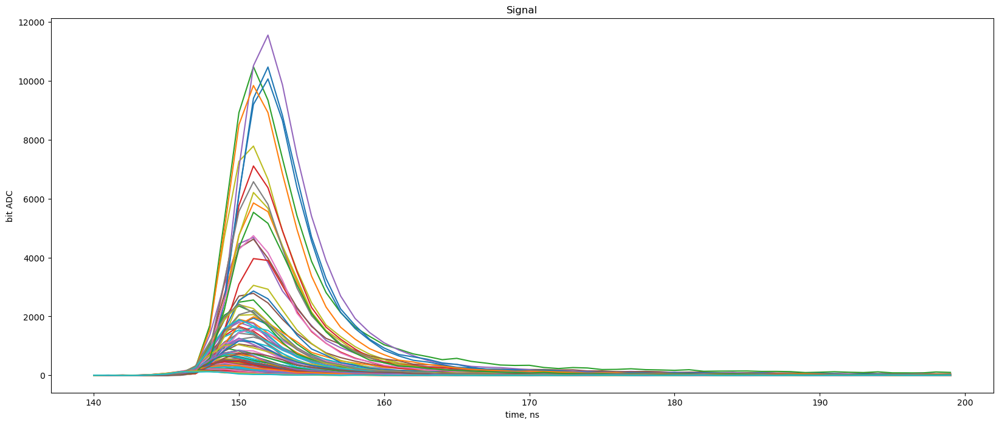

In [11]:
ax = (2**14-dataset.T[N]-1560)[140:200].plot(title='Signal' ,legend=None,figsize=(20,8))
ax.set_xlabel("time, ns")
ax.set_ylabel("bit ADC")


# Шаг 1. Пересчет признаков (с учетом вашего сдвига)

In [12]:
import pandas as pd
import numpy as np

# Инвертируем весь датасет по вашей формуле
inverted_all = 2**14 - dataset - 1560

features = pd.DataFrame()

# 1. Амплитуда (максимум в районе всплеска)
features['amplitude'] = inverted_all.iloc[:, 140:170].max(axis=1)

# 2. Полная площадь импульса (интеграл от начала пика до затухания)
features['total_area'] = inverted_all.iloc[:, 145:190].sum(axis=1)

# 3. Площадь хвоста (важнейшая фаза затухания, например с 158 по 190 нс)
features['tail_area'] = inverted_all.iloc[:, 158:190].sum(axis=1)

# 4. Классический параметр PSD
features['psd_ratio'] = features['tail_area'] / (features['total_area'] + 1e-6)

print("Признаки успешно рассчитаны!")


Признаки успешно рассчитаны!


# Шаг 2. Визуализация признаков (Scatter Plot и Гистограмма)

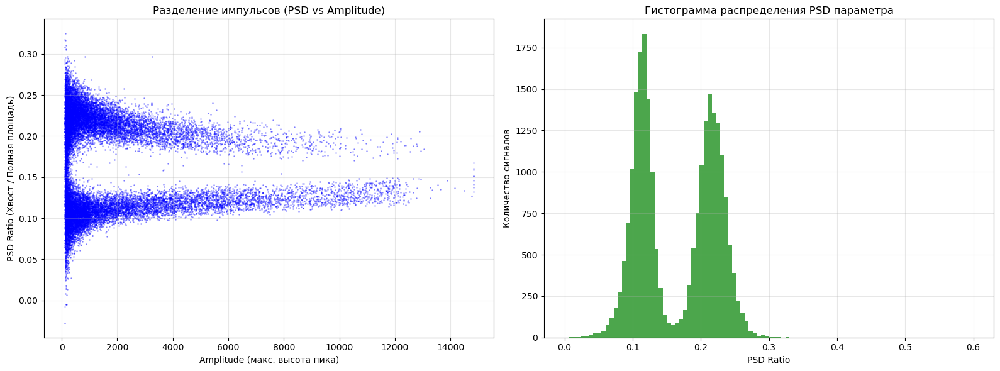

In [13]:
import matplotlib.pyplot as plt

fig, ax = plt.subplots(1, 2, figsize=(16, 6))

# График 1: Scatter plot (Амплитуда vs PSD)
ax[0].scatter(features['amplitude'], features['psd_ratio'], s=1, alpha=0.3, color='blue')
ax[0].set_title('Разделение импульсов (PSD vs Amplitude)')
ax[0].set_xlabel('Amplitude (макс. высота пика)')
ax[0].set_ylabel('PSD Ratio (Хвост / Полная площадь)')
ax[0].grid(True, alpha=0.3)

# График 2: Распределение (Гистограмма) самого важного признака PSD
ax[1].hist(features['psd_ratio'], bins=100, range=(0, 0.6), color='green', alpha=0.7)
ax[1].set_title('Гистограмма распределения PSD параметра')
ax[1].set_xlabel('PSD Ratio')
ax[1].set_ylabel('Количество сигналов')
ax[1].grid(True, alpha=0.3)

plt.tight_layout()
plt.show()


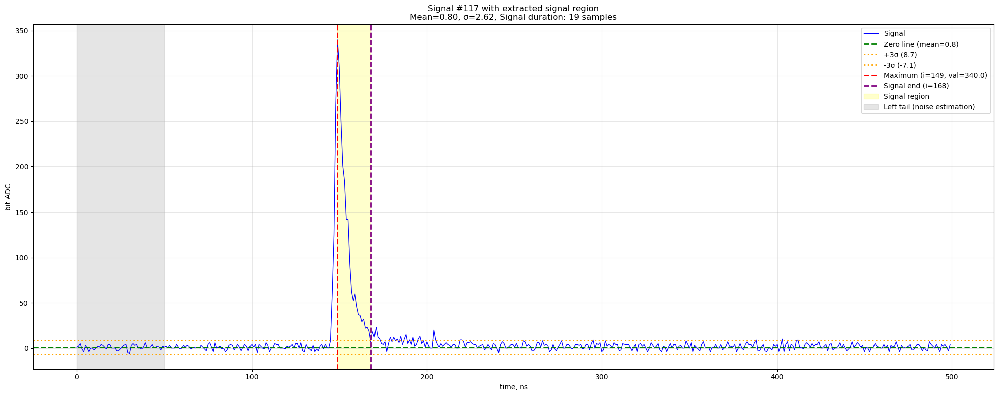

Сигнал #117:
  Нулевая линия (среднее левого хвоста): 0.80
  Стандартное отклонение шума: 2.62
  Индекс максимума: 149
  Значение максимума: 340.00
  Конец сигнала: 168
  Длительность сигнала: 19 отсчётов


In [14]:
import numpy as np
import matplotlib.pyplot as plt

# Берём один сигнал для наглядной демонстрации
signal_idx = 117
signal = (2**14 - dataset.T[signal_idx] - 1560).values

# Параметры выделения сигнала
left_tail_length = 50  # первые 50 отсчётов - левый хвост (шум)
n_sigma = 3            # порог в стандартных отклонениях

# 1. Нулевая линия = среднее значение левого хвоста
zero_line = np.mean(signal[:left_tail_length])
# 2. Стандартное отклонение шума
noise_std = np.std(signal[:left_tail_length])

# 3. Находим индекс максимума
i_max = np.argmax(signal)

# 4. Ищем конец сигнала: идём от максимума вправо, 
#    ищем первый индекс где |signal - zero_line| <= n_sigma * noise_std
signal_end = i_max
for i in range(i_max, len(signal)):
    if abs(signal[i] - zero_line) <= n_sigma * noise_std:
        signal_end = i
        break

# 5. Визуализация
fig, ax = plt.subplots(figsize=(20, 8))

# Рисуем сигнал
ax.plot(signal, color='blue', linewidth=1, label='Signal')

# Нулевая линия (среднее левого хвоста)
ax.axhline(y=zero_line, color='green', linestyle='--', linewidth=2, 
           label=f'Zero line (mean={zero_line:.1f})')

# Границы ±3σ от нулевой линии
ax.axhline(y=zero_line + n_sigma * noise_std, color='orange', linestyle=':', 
           linewidth=2, label=f'+{n_sigma}σ ({zero_line + n_sigma*noise_std:.1f})')
ax.axhline(y=zero_line - n_sigma * noise_std, color='orange', linestyle=':', 
           linewidth=2, label=f'-{n_sigma}σ ({zero_line - n_sigma*noise_std:.1f})')

# Вертикальная линия максимума
ax.axvline(x=i_max, color='red', linestyle='--', linewidth=2, 
           label=f'Maximum (i={i_max}, val={signal[i_max]:.1f})')

# Вертикальная линия конца сигнала
ax.axvline(x=signal_end, color='purple', linestyle='--', linewidth=2, 
           label=f'Signal end (i={signal_end})')

# Заштриховываем область сигнала
ax.axvspan(i_max, signal_end, alpha=0.2, color='yellow', label='Signal region')

# Заштриховываем левый хвост (область шума для оценки параметров)
ax.axvspan(0, left_tail_length, alpha=0.2, color='gray', label='Left tail (noise estimation)')

ax.set_xlabel("time, ns")
ax.set_ylabel("bit ADC")
ax.set_title(f'Signal #{signal_idx} with extracted signal region\n'
             f'Mean={zero_line:.2f}, σ={noise_std:.2f}, '
             f'Signal duration: {signal_end - i_max} samples')
ax.legend(loc='upper right', fontsize=10)
ax.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

print(f"Сигнал #{signal_idx}:")
print(f"  Нулевая линия (среднее левого хвоста): {zero_line:.2f}")
print(f"  Стандартное отклонение шума: {noise_std:.2f}")
print(f"  Индекс максимума: {i_max}")
print(f"  Значение максимума: {signal[i_max]:.2f}")
print(f"  Конец сигнала: {signal_end}")
print(f"  Длительность сигнала: {signal_end - i_max} отсчётов")

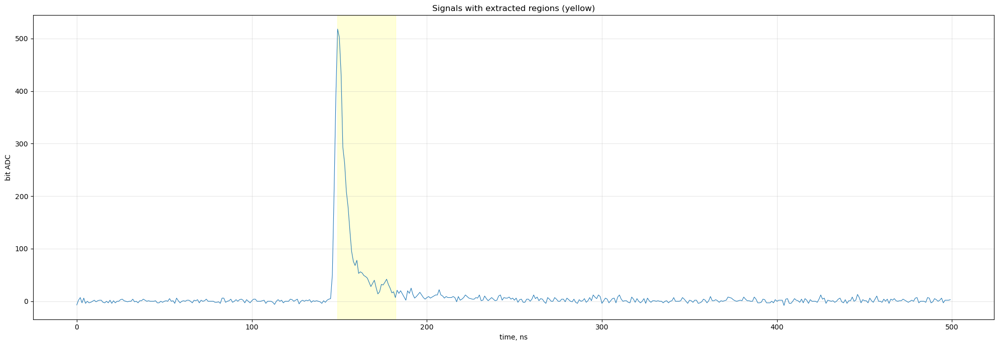

In [15]:
# Визуализация для нескольких сигналов с выделенными областями
N_demo = range(715, 716)
fig, ax = plt.subplots(figsize=(20, 7))

for idx in N_demo:
    signal = (2**14 - dataset.T[idx] - 1560).values
    
    zero_line = np.mean(signal[:left_tail_length])
    noise_std = np.std(signal[:left_tail_length])
    i_max = np.argmax(signal)
    
    signal_end = i_max
    for i in range(i_max, len(signal)):
        if abs(signal[i] - zero_line) <= n_sigma * noise_std:
            signal_end = i
            break
    
    ax.plot(signal, linewidth=0.8)
    ax.axvspan(i_max, signal_end, alpha=0.15, color='yellow')

ax.set_xlabel("time, ns")
ax.set_ylabel("bit ADC")
ax.set_title('Signals with extracted regions (yellow)')
ax.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

In [16]:
import matplotlib.pyplot as plt
import numpy as np


def plot_scintillation_signal(
    dataset, signal_idx, left_tail_length=50, n_sigma=3
):
    """Функция для анализа и визуализации отдельного сигнала сцинтиллятора.

    Параметры:
    - dataset: исходный pandas DataFrame с сигналами
    - signal_idx: индекс строки/сигнала для анализа
    - left_tail_length: количество первых отсчетов для оценки шума
    - n_sigma: порог чувствительности к шуму (количество сигм)
    """
    # Берём один сигнал по вашей формуле инверсии
    # Если в вашем Jupyter dataset — это DataFrame, используем .iloc[signal_idx]
    # Если в коде использовался .T[signal_idx], то .iloc[signal_idx] эквивалентен построчному датасету
    signal = (2**14 - dataset.iloc[signal_idx] - 1560).values

    # 1. Нулевая линия = среднее значение левого хвоста
    zero_line = np.mean(signal[:left_tail_length])

    # 2. Стандартное отклонение шума
    noise_std = np.std(signal[:left_tail_length])

    # 3. Находим индекс максимума
    i_max = np.argmax(signal)

    # 4. Ищем конец сигнала: идём от максимума вправо
    signal_end = i_max
    for i in range(i_max, len(signal)):
        if abs(signal[i] - zero_line) <= n_sigma * noise_std:
            signal_end = i
            break

    # 5. Визуализация
    fig, ax = plt.subplots(figsize=(20, 8))

    # Рисуем сигнал
    ax.plot(signal, color="blue", linewidth=1, label="Signal")

    # Нулевая линия (среднее левого хвоста)
    ax.axhline(
        y=zero_line,
        color="green",
        linestyle="--",
        linewidth=2,
        label=f"Zero line (mean={zero_line:.1f})",
    )

    # Границы +-3sigma от нулевой линии
    ax.axhline(
        y=zero_line + n_sigma * noise_std,
        color="orange",
        linestyle=":",
        linewidth=2,
        label=f"+{n_sigma}sigma ({zero_line + n_sigma*noise_std:.1f})",
    )
    ax.axhline(
        y=zero_line - n_sigma * noise_std,
        color="orange",
        linestyle=":",
        linewidth=2,
        label=f"-{n_sigma}sigma ({zero_line - n_sigma*noise_std:.1f})",
    )

    # Вертикальная линия максимума
    ax.axvline(
        x=i_max,
        color="red",
        linestyle="--",
        linewidth=2,
        label=f"Maximum (i={i_max}, val={signal[i_max]:.1f})",
    )

    # Вертикальная линия конца сигнала
    ax.axvline(
        x=signal_end,
        color="purple",
        linestyle="--",
        linewidth=2,
        label=f"Signal end (i={signal_end})",
    )

    # Заштриховываем область сигнала
    ax.axvspan(
        i_max, signal_end, alpha=0.2, color="yellow", label="Signal region"
    )

    # Заштриховываем левый хвост (область шума для оценки параметров)
    ax.axvspan(
        0,
        left_tail_length,
        alpha=0.2,
        color="gray",
        label="Left tail (noise estimation)",
    )

    ax.set_xlabel("time, ns")
    ax.set_ylabel("bit ADC")
    ax.set_title(
        f"Signal #{signal_idx} with extracted signal region\n"
        f"Mean={zero_line:.2f}, \\sigma={noise_std:.2f}, \n"
        f"Signal duration: {signal_end - i_max} samples"
    )

    ax.legend(loc="upper right", fontsize=10)
    ax.grid(True, alpha=0.3)
    plt.tight_layout()
    plt.show()

    # Вывод текстовой информации в консоль
    print(f"Сигнал #{signal_idx}:")
    print(f" Нулевая линия (среднее левого хвоста): {zero_line:.2f}")
    print(f" Стандартное отклонение шума: {noise_std:.2f}")
    print(f" Индекс максимума: {i_max}")
    print(f" Значение максимума: {signal[i_max]:.2f}")


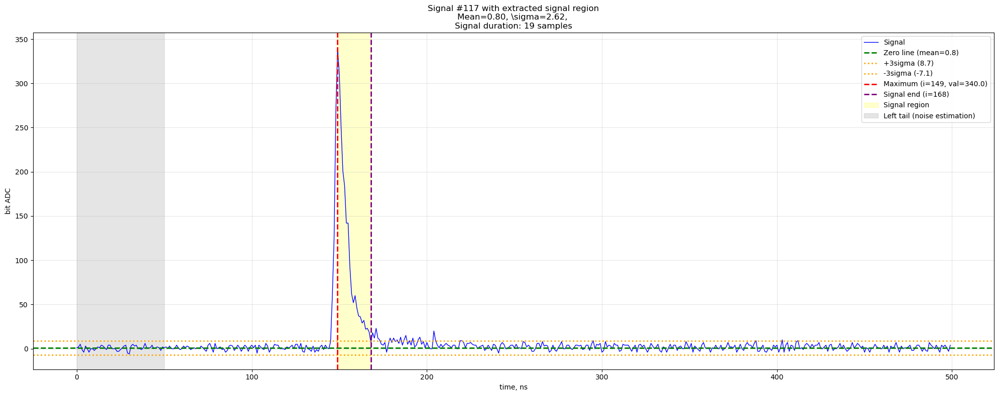

Сигнал #117:
 Нулевая линия (среднее левого хвоста): 0.80
 Стандартное отклонение шума: 2.62
 Индекс максимума: 149
 Значение максимума: 340.00


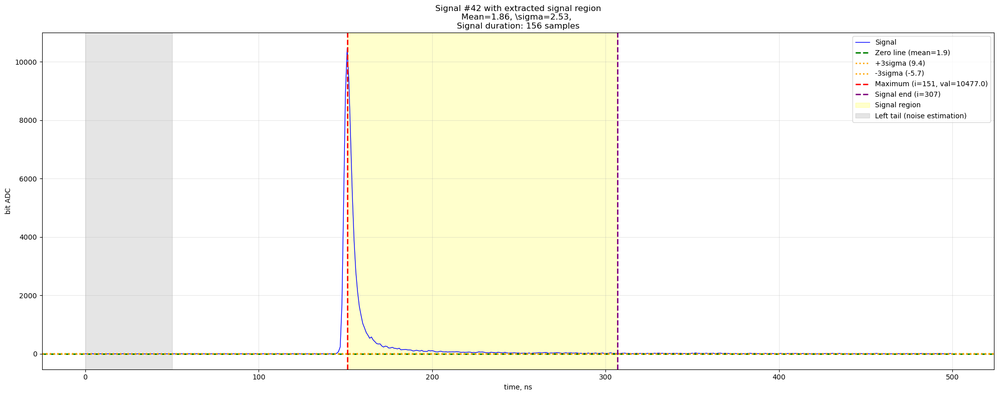

Сигнал #42:
 Нулевая линия (среднее левого хвоста): 1.86
 Стандартное отклонение шума: 2.53
 Индекс максимума: 151
 Значение максимума: 10477.00


In [17]:
# Посмотреть сигнал под номером 117
plot_scintillation_signal(dataset, signal_idx=117)

# Посмотреть другой сигнал (например, 42) с дефолтными или измененными параметрами шума
plot_scintillation_signal(dataset, signal_idx=42)


# Шаг 2: Масштабируем алгоритм на весь датасет

In [18]:
import pandas as pd
import numpy as np
from tqdm import tqdm

# Параметры выделения сигнала (из вашего кода)
left_tail_length = 50
n_sigma = 3

features_list = []

# Транспонируем и переводим в numpy array для максимального ускорения цикла
# В вашей логике: signal = (2**14 - dataset.T[signal_idx] - 1560).values
# Мы делаем это сразу для всей матрицы:
signals_matrix = (2**14 - dataset - 1560).values

for idx in tqdm(range(len(signals_matrix)), desc="Обработка сигналов"):
    signal = signals_matrix[idx]
    
    # # 1. Нулевая линия = среднее значение левого хвоста
    zero_line = np.mean(signal[:left_tail_length])
    
    # # 2. Стандартное отклонение шума
    noise_std = np.std(signal[:left_tail_length])
    
    # # 3. Находим индекс максимума
    i_max = np.argmax(signal)
    val_max = signal[i_max]
    
    # # 4. Ищем конец сигнала: идём от максимума вправо
    signal_end = i_max
    for i in range(i_max, len(signal)):
        if abs(signal[i] - zero_line) <= n_sigma * noise_std:
            signal_end = i
            break
            
    # Длительность сигнала (количество отсчётов)
    signal_duration = signal_end - i_max
    
    # --- РАСЧЕТ ФИЗИЧЕСКИХ ПРИЗНАКОВ (Feature Engineering) ---
    # Сигнал, очищенный от индивидуальной нулевой линии
    signal_clean = signal - zero_line
    
    # В качестве начала значимой области импульса возьмем i_max (или чуть левее, например i_max - 5)
    # По вашей логике закрашивания берется интервал от i_max до signal_end
    start_idx = i_max 
    
    # Полная площадь импульса (интеграл полезной области)
    total_area = np.sum(signal_clean[start_idx:signal_end])
    
    # Площадь хвоста (используется для PSD разделения частиц)
    # Начинаем считать "хвост" через фиксированное количество отсчетов от пика (например, +8 отсчетов)
    tail_start = min(i_max + 8, signal_end)
    tail_area = np.sum(signal_clean[tail_start:signal_end])
    
    # Физический параметр PSD (отношение площадей)
    psd_ratio = tail_area / (total_area + 1e-6)
    
    # Сохраняем все вычисленные параметры
    features_list.append({
        'amplitude': val_max - zero_line, # Чистая амплитуда пика над нулевой линией
        'total_area': total_area,
        'tail_area': tail_area,
        'psd_ratio': psd_ratio,
        'duration': signal_duration,
        'zero_line': zero_line,
        'noise_std': noise_std
    })

# Создаем итоговый датафрейм для обучения моделей
df_features = pd.DataFrame(features_list)

print(f"\nОбработка завершена! Создана таблица размерностью: {df_features.shape}")
display(df_features.head())


Обработка сигналов: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████| 23479/23479 [00:02<00:00, 10796.06it/s]


Обработка завершена! Создана таблица размерностью: (23479, 7)


,amplitude,total_area,tail_area,psd_ratio,duration,zero_line,noise_std
0,530.48,2849.52,588.68,0.206589,24,2.52,2.906820
1,1901.48,9437.24,1248.40,0.132284,38,1.52,2.443276
2,2557.90,10529.40,1463.20,0.138963,36,2.10,2.410394
3,564.56,3365.48,757.00,0.224931,33,1.44,2.721470
4,1793.60,8588.00,1185.20,0.138007,30,2.40,2.835489


In [19]:
df_features.describe()

,amplitude,total_area,tail_area,psd_ratio,duration,zero_line,noise_std
count,23479.000000,23479.000000,23479.000000,23479.000000,23479.000000,23479.000000,23479.000000
mean,1835.104716,9486.623925,1967.314038,0.187703,38.992589,1.033493,2.680664
std,2389.300501,12013.951279,2633.348547,0.089281,28.968814,0.856405,0.264567
min,104.300000,320.420000,0.000000,0.000000,6.000000,-2.480000,1.673440
25%,308.160000,1556.960000,235.680000,0.116857,17.000000,0.460000,2.501520
50%,812.540000,4266.320000,828.600000,0.155117,29.000000,1.040000,2.674621
75%,2315.050000,12520.470000,2706.260000,0.278860,53.000000,1.620000,2.854050
max,14824.840000,95463.960000,21321.480000,0.395663,216.000000,5.080000,3.753665


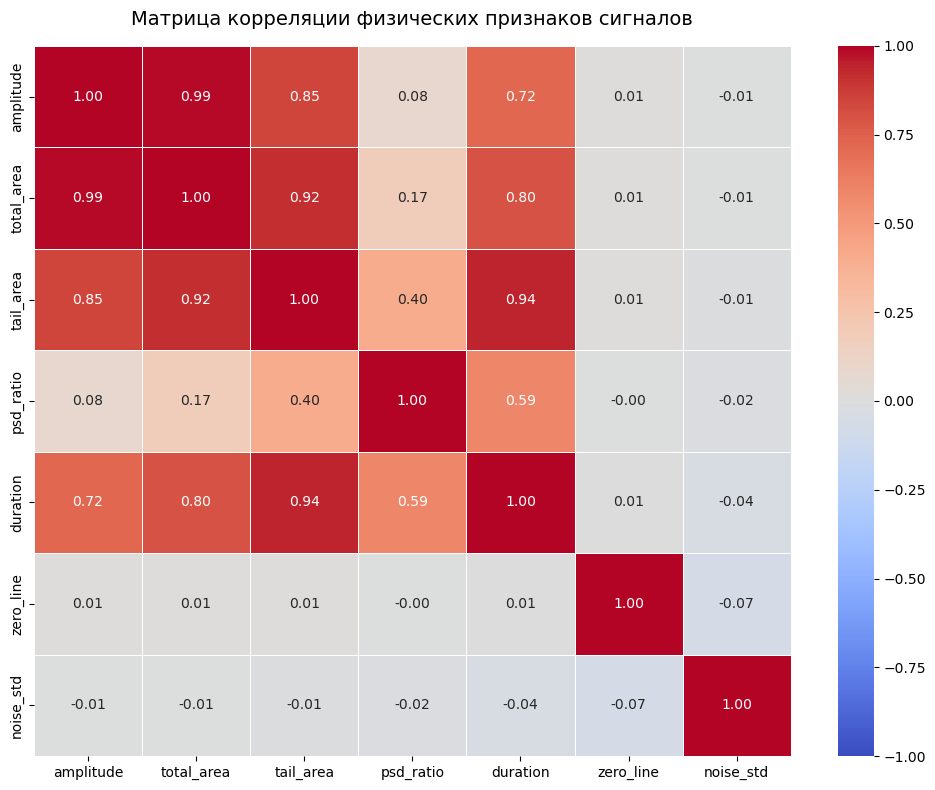

In [20]:
import matplotlib.pyplot as plt
import seaborn as sns

# Вычисляем матрицу корреляции Пирсона
corr_matrix = df_features.corr()

# Настраиваем размер графика
plt.figure(figsize=(10, 8))

# Строим тепловую карту (Heatmap)
sns.heatmap(
    corr_matrix,
    annot=True,  # Выводить коэффициенты внутри ячеек
    cmap="coolwarm",  # Красивая физическая палитра (от синего к красному)
    fmt=".2f",  # Округлять до 2 знаков после запятой
    linewidths=0.5,  # Тонкие границы между ячейками
    vmin=-1,
    vmax=1,  # Границы шкалы корреляции
)

plt.title("Матрица корреляции физических признаков сигналов", fontsize=14, pad=15)
plt.tight_layout()
plt.show()


### Анализ корреляционной матрицы признаков:
* **Инвариантность формы (PSD):** Корреляция между `amplitude` и `psd_ratio` составляет всего **0.08**, что подтверждает математическую корректность нормировки. Форма импульса не зависит от энергии зарегистрированного события.
* **Мультиколлинеарность:** Параметры `amplitude` и `total_area` сильно скоррелированы (**0.99**). Для обучения геометрических моделей кластеризации следует использовать только один из них (предпочтительно `amplitude`), чтобы избежать искусственного завышения веса энергетической компоненты.
* **Аппаратурный шум:** Параметры шума (`zero_line`, `noise_std`) имеют нулевую корреляцию с физическими параметрами импульсов, что доказывает их случайную триггерную природу и подтверждает необходимость индивидуальной фильтрации каждого сигнала.


## Ячейка 2: Визуализация признаков и гистограммы) 

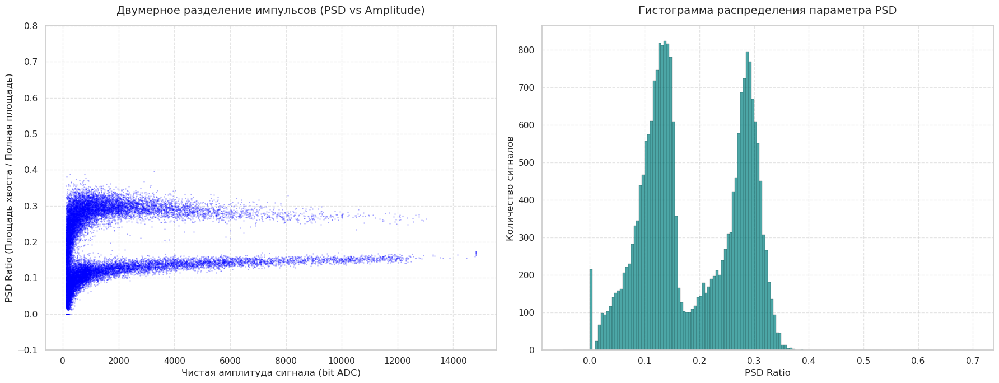

In [21]:
import matplotlib.pyplot as plt
import seaborn as sns

# Настраиваем стиль графиков
sns.set_theme(style="whitegrid")
fig, ax = plt.subplots(1, 2, figsize=(18, 7))

# --- ГРАФИК 1: Scatter Plot (Амплитуда vs PSD) ---
# Использование alpha=0.2 и s=1 помогает избежать сливания точек в сплошное пятно
ax[0].scatter(df_features['amplitude'], df_features['psd_ratio'], s=1, alpha=0.2, color='blue')
ax[0].set_title('Двумерное разделение импульсов (PSD vs Amplitude)', fontsize=14, pad=15)
ax[0].set_xlabel('Чистая амплитуда сигнала (bit ADC)', fontsize=12)
ax[0].set_ylabel('PSD Ratio (Площадь хвоста / Полная площадь)', fontsize=12)

# Ограничим диапазон по оси Y, чтобы детальнее рассмотреть кластеры 
# (при необходимости настройте под ваши данные)
ax[0].set_ylim(-0.1, 0.8) 
ax[0].grid(True, linestyle='--', alpha=0.5)

# --- ГРАФИК 2: Гистограмма распределения параметра PSD ---
# Показывает плотность распределения и наличие пиков-компонент
ax[1].hist(df_features['psd_ratio'], bins=150, range=(-0.05, 0.7), color='teal', alpha=0.7, edgecolor='black', linewidth=0.2)
ax[1].set_title('Гистограмма распределения параметра PSD', fontsize=14, pad=15)
ax[1].set_xlabel('PSD Ratio', fontsize=12)
ax[1].set_ylabel('Количество сигналов', fontsize=12)
ax[1].grid(True, linestyle='--', alpha=0.5)

plt.tight_layout()
plt.show()


Как это выглядит на ваших графиках:
* Нижняя ветвь (PSD $\approx 0.13$): Сигналы с коротким хвостом. Это Гамма-кванты (Класс 0). Их в потоке обычно большинство.
* Верхняя ветвь (PSD $\approx 0.29$): Сигналы с длинным, затяжным хвостом. Это Нейтроны (Класс 1).
* Узкий пик на нуле (PSD $\le 0.02$): Сигналы, которые либо забиты шумом аппаратуры, либо обрезаны триггером сбора данных (не успели накопиться). Это Аномалии/Выбросы (Кластер 2).

# Блок 3: «Класс для хранения и сравнения моделей»

In [22]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import silhouette_score

class ClusteringExperiment:
    def __init__(self, model, name="Model"):
        self.model = model
        self.name = name
        self.labels = None
        self.scaler = StandardScaler()
        
    def fit_predict(self, df, feature_cols):
        # 1. Выделяем признаки и масштабируем их
        X = df[feature_cols].values
        X_scaled = self.scaler.fit_transform(X)
        
        # 2. Обучаем модель и предсказываем кластеры
        print(f"Обучение модели {self.name}...")
        self.labels = self.model.fit_predict(X_scaled)
        
        # Записываем метки обратно в копию датафрейма для визуализации
        df_res = df.copy()
        df_res['cluster'] = self.labels
        return df_res
    
    def evaluate(self, df, feature_cols, sample_size=5000):
        if self.labels is None:
            print("Сначала обучите модель!")
            return
            
        X = df[feature_cols].values
        
        # Так как датасет большой (23k), Silhouette Score считаем по подвыборке для скорости
        np.random.seed(42)
        idx = np.random.choice(len(X), size=min(sample_size, len(X)), replace=False)
        
        sil = silhouette_score(X[idx], self.labels[idx])
        print(f"[{self.name}] Silhouette Score (на выборке {len(idx)} точек): {sil:.4f}")
        return sil

    def plot_clusters(self, df_res):
        # Строим график разделения, раскрашенный моделью
        plt.figure(figsize=(10, 6))
        
        # Находим уникальные кластеры (включая -1 для DBSCAN аномалий)
        unique_labels = np.unique(df_res['cluster'])
        
        for label in unique_labels:
            clustered_data = df_res[df_res['cluster'] == label]
            lbl_name = f"Кластер {label}" if label != -1 else "Аномалии (-1)"
            plt.scatter(clustered_data['amplitude'], clustered_data['psd_ratio'], 
                        s=1, alpha=0.4, label=lbl_name)
            
        plt.title(f"Результат кластеризации: {self.name}")
        plt.xlabel('Чистая амплитуда сигнала (bit ADC)')
        plt.ylabel('PSD Ratio')
        plt.legend(markerscale=10)
        plt.grid(True, linestyle='--', alpha=0.5)
        plt.show()


# Метод 1: Пороговое разделение (Прямое физическое правило)

Давайте запрограммируем это как нашу первую модель, используя найденные по графикам пороги:
* Если psd_ratio меньше или равен 0.02 $\rightarrow$ это явная аномалия (Кластер 2).
* Если psd_ratio лежит между 0.02 и 0.20 $\rightarrow$ это первая частица (Класс 0).
* Если psd_ratio больше 0.20 $\rightarrow$ это вторая частица (Класс 1).

Код для ячейки «Метод 1 - Разделение по гистограмме»:

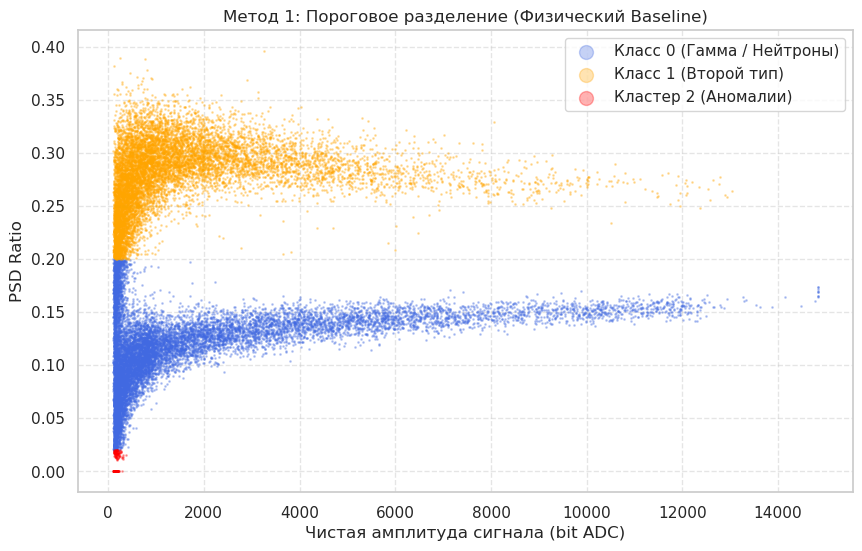

Распределение сигналов по кластерам:
cluster
0    12747
1    10425
2      307
Name: count, dtype: int64


In [23]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

def threshold_classifier(df):
    # Создаем массив для меток класса
    labels = np.zeros(len(df), dtype=int)
    
    # Условия на основе вашей гистограммы
    is_anomaly = df['psd_ratio'] <= 0.02
    is_class_1 = df['psd_ratio'] > 0.20
    
    # Заполняем согласно условию задачи
    labels[is_class_1] = 1   # Второй тип частиц
    labels[is_anomaly] = 2   # Аномалии и выбросы
    # Все остальные автоматически остаются Классом 0 (первый тип частиц)
    
    return labels

# Выполняем предсказание бейслайна
df_baseline = df_features.copy()
df_baseline['cluster'] = threshold_classifier(df_baseline)

# Визуализация результатов бейслайна
plt.figure(figsize=(10, 6))
colors = {0: 'royalblue', 1: 'orange', 2: 'red'}
labels_dict = {0: 'Класс 0 (Гамма / Нейтроны)', 1: 'Класс 1 (Второй тип)', 2: 'Кластер 2 (Аномалии)'}

for cluster_id in [0, 1, 2]:
    sub = df_baseline[df_baseline['cluster'] == cluster_id]
    plt.scatter(sub['amplitude'], sub['psd_ratio'], s=1, alpha=0.3, 
                color=colors[cluster_id], label=labels_dict[cluster_id])

plt.title('Метод 1: Пороговое разделение (Физический Baseline)')
plt.xlabel('Чистая амплитуда сигнала (bit ADC)')
plt.ylabel('PSD Ratio')
plt.legend(markerscale=10)
plt.grid(True, linestyle='--', alpha=0.5)
plt.show()

print("Распределение сигналов по кластерам:")
print(df_baseline['cluster'].value_counts())


# Метод 2: Обучение Gaussian Mixture Model (Ячейка 4)

In [24]:
from sklearn.mixture import GaussianMixture
import pandas as pd
import numpy as np

# Инициализируем модель GMM на 3 кластера
# covariance_type='full' позволяет эллипсам вращаться и растягиваться в любую сторону
gmm_model = GaussianMixture(n_components=3, covariance_type='full', random_state=42)

# Создаем эксперимент на базе нашего класса
gmm_experiment = ClusteringExperiment(gmm_model, name="Gaussian Mixture Model")

# Выбираем ключевые признаки, которые мы спроектировали на этапе EDA
features_to_use = ['amplitude', 'psd_ratio']

# Обучаем модель и получаем размеченный датафрейм
df_gmm_results = gmm_experiment.fit_predict(df_features, features_to_use)

# Оцениваем качество кластеризации метрикой силуэта
gmm_experiment.evaluate(df_features, features_to_use)

# Маппинг кластеров под условия задачи
# GMM присваивает индексы (0, 1, 2) случайно. Давайте проверим, какой кластер за что отвечает, 
# посмотрев на среднее значение psd_ratio для каждого кластера.
cluster_means = df_gmm_results.groupby('cluster')['psd_ratio'].mean().sort_values()
print("\nСредний PSD для каждого полученного кластера:\n", cluster_means)

Обучение модели Gaussian Mixture Model...
[Gaussian Mixture Model] Silhouette Score (на выборке 5000 точек): 0.0701

Средний PSD для каждого полученного кластера:
 cluster
1    0.095737
2    0.188492
0    0.270139
Name: psd_ratio, dtype: float64


In [25]:
df_gmm_results

,amplitude,total_area,tail_area,psd_ratio,duration,zero_line,noise_std,cluster
0,530.48,2849.52,588.68,0.206589,24,2.52,2.906820,0
1,1901.48,9437.24,1248.40,0.132284,38,1.52,2.443276,2
2,2557.90,10529.40,1463.20,0.138963,36,2.10,2.410394,2
3,564.56,3365.48,757.00,0.224931,33,1.44,2.721470,0
4,1793.60,8588.00,1185.20,0.138007,30,2.40,2.835489,2
...,...,...,...,...,...,...,...,...
23474,504.34,2550.80,294.08,0.115289,20,-0.34,2.294428,1
23475,5765.96,35607.04,9275.36,0.260492,99,1.04,2.821064,2
23476,4998.02,30465.54,9424.38,0.309346,127,0.98,2.731227,2
23477,1456.04,8871.20,2611.88,0.294422,55,0.96,2.697851,0


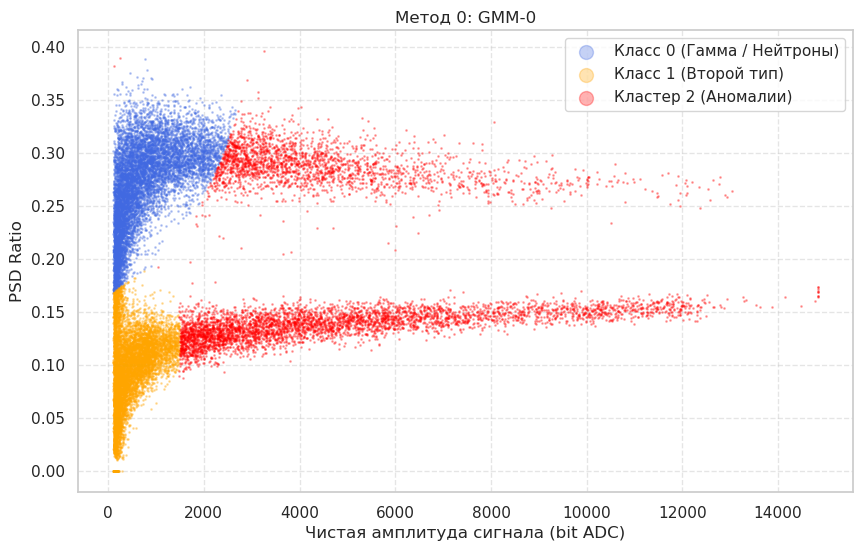

In [26]:
# Визуализация результатов бейслайна
plt.figure(figsize=(10, 6))
colors = {0: 'royalblue', 1: 'orange', 2: 'red'}
labels_dict = {0: 'Класс 0 (Гамма / Нейтроны)', 1: 'Класс 1 (Второй тип)', 2: 'Кластер 2 (Аномалии)'}

for cluster_id in [0, 1, 2]:
    sub = df_gmm_results[df_gmm_results['cluster'] == cluster_id]
    plt.scatter(sub['amplitude'], sub['psd_ratio'], s=1, alpha=0.3, 
                color=colors[cluster_id], label=labels_dict[cluster_id])

plt.title('Метод 0: GMM-0')
plt.xlabel('Чистая амплитуда сигнала (bit ADC)')
plt.ylabel('PSD Ratio')
plt.legend(markerscale=10)
plt.grid(True, linestyle='--', alpha=0.5)
plt.show()

Посмотрим на полученные средние значения psd_ratio для каждого кластера модели GMM:
* Кластер 1: средний PSD $\approx 0.096$
* Кластер 2: средний PSD $\approx 0.188$
* Кластер 0: средний PSD $\approx 0.270$

⚠️ Внимание: Ловушка алгоритма!

GMM сошлась так, что она не выделила аномалии у нуля в отдельный кластер. Вместо этого она:
1. Забрала нижнюю ветку (гамма) вместе с аномалиями у нуля в Кластер 1 (из-за этого среднее сместилось к $0.096$).
2. Разрезала пространство между ветками или выделила промежуточные точки в Кластер 2 ($0.188$).
3. Забрала верхнюю ветку (нейтроны) в Кластер 0 ($0.270$).

По условиям ТЗ, Кластер 2 — это строго аномалии, смешанные или выбросы, а не середина между ветками. Чистый GMM без предварительной фильтрации шума здесь отработал неидеально (низкий Silhouette Score $0.07$ это подтверждает).

In [27]:
import numpy as np
import pandas as pd

# Создаем массив финальных предсказаний
final_clusters = np.zeros(len(df_features), dtype=int)

# Шаг 1. Физическое выделение аномалий (Кластер 2)
# Отсекаем околонулевой шум и выбросы по длительности или PSD
is_anomaly = (df_features['psd_ratio'] <= 0.02) | (df_features['duration'] < 5)

# Шаг 2. Разделение оставшихся чистых сигналов частиц с помощью GMM
# Точки из Кластера 0 модели GMM — это явно верхняя ветвь (Нейтроны -> Класс 1)
is_neutron = (df_gmm_results['cluster'] == 0)

# Применяем маппинг строго по ТЗ:
# По умолчанию все точки равны 0 (Класс 0 -> Гамма-кванты)
final_clusters[is_neutron] = 1  # Класс 1 -> Нейтроны
final_clusters[is_anomaly] = 2  # Кластер 2 -> Аномалии/выбросы

# Шаг 3. Сборка и сохранение файла для Kaggle
submission = pd.DataFrame()
submission['index'] = dataset.index
submission['cluster'] = final_clusters

# Сортируем строго по порядку индексов
submission = submission.sort_values(by='index').reset_index(drop=True)
submission.to_csv('submission_final.csv', index=False)

print("Финальное распределение по классам для Kaggle:")
print(submission['cluster'].value_counts())
print("\nФайл 'submission_final.csv' успешно сформирован и готов к отправке!")


Финальное распределение по классам для Kaggle:
cluster
0    14423
1     8749
2      307
Name: count, dtype: int64

Файл 'submission_final.csv' успешно сформирован и готов к отправке!


In [28]:
submission.cluster.unique()

array([1, 0, 2])

In [29]:
submission

,index,cluster
0,0,1
1,1,0
2,2,0
3,3,1
4,4,0
...,...,...
23474,23474,0
23475,23475,0
23476,23476,0
23477,23477,1


In [30]:
unique_labels = submission['cluster'].unique()

# Создаем маппинг автоматически: значение -> порядковый номер (начиная с 0)
mapping = {val: i + 0 for i, val in enumerate(unique_labels)}

# Применяем маппинг
submission['cluster'] = submission['cluster'].map(mapping)

In [31]:
# Проверяем формат
print("\nПервые 10 строк submission:")
print(submission.head(10))
print(f"\nРазмер submission: {submission.shape}")
print(f"Колонки: {submission.columns.tolist()}")

# Сохраняем в CSV файл
submission_filename = path + "/" + 'submission_final.csv'


Первые 10 строк submission:
   index  cluster
0      0        0
1      1        1
2      2        1
3      3        0
4      4        1
5      5        0
6      6        0
7      7        1
8      8        1
9      9        0

Размер submission: (23479, 2)
Колонки: ['index', 'cluster']


In [32]:
path

'/home/itj/.cache/kagglehub/competitions/scintillation-detector'

In [33]:
submission.to_csv(submission_filename, index=False)
print(f"\nФайл сохранен: {submission_filename}")

# Выводим информацию для загрузки на Kaggle
print("\n" + "="*60)
print("ИНСТРУКЦИЯ ДЛЯ ЗАГРУЗКИ НА KAGGLE")
print("="*60)
print(f"1. Файл для загрузки: {submission_filename}")
print(f"2. Формат: index,cluster")
print(f"3. Количество записей: {len(submission)}")
# print(f"4. Метод: {best_method['Метод']}")
# print(f"5. Calinski-Harabasz Score: {best_method['Calinski-Harabasz']:.2f}")
# print(f"6. Silhouette Score: {best_method['Silhouette Score']:.4f}")
print("="*60)


Файл сохранен: /home/itj/.cache/kagglehub/competitions/scintillation-detector/submission_final.csv

ИНСТРУКЦИЯ ДЛЯ ЗАГРУЗКИ НА KAGGLE
1. Файл для загрузки: /home/itj/.cache/kagglehub/competitions/scintillation-detector/submission_final.csv
2. Формат: index,cluster
3. Количество записей: 23479


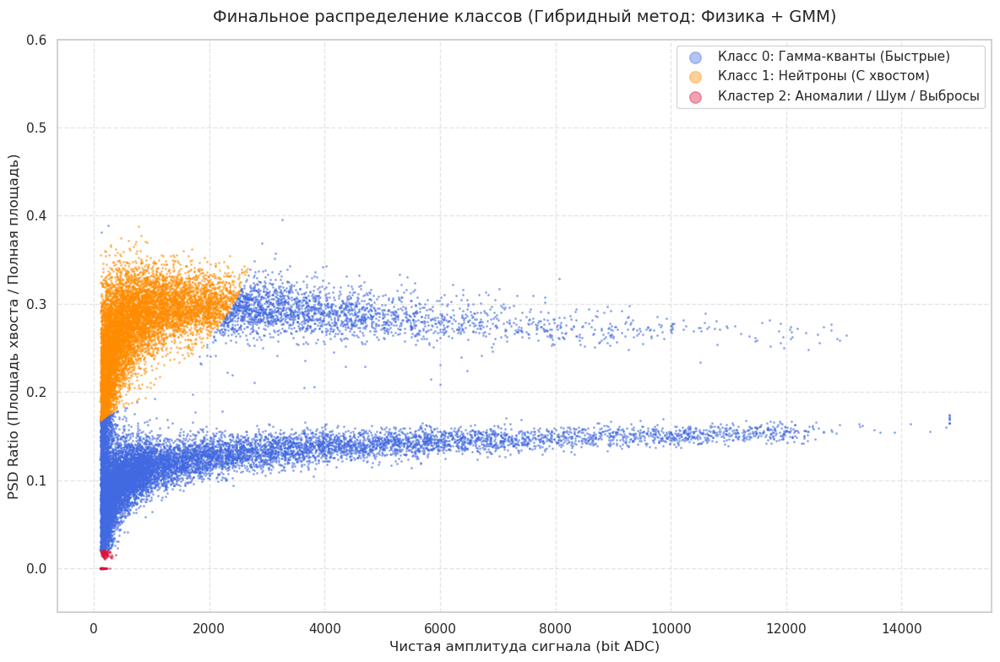

In [34]:
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 8))

# Словарь цветов и названий по ТЗ
colors = {0: 'royalblue', 1: 'darkorange', 2: 'crimson'}
labels_dict = {
    0: 'Класс 0: Гамма-кванты (Быстрые)',
    1: 'Класс 1: Нейтроны (С хвостом)',
    2: 'Кластер 2: Аномалии / Шум / Выбросы'
}

# Добавляем финальные метки в датафрейм для графика
df_features['final_cluster'] = final_clusters

# Перебираем классы по очереди для отрисовки слоев
for cluster_id in [0, 1, 2]:
    sub = df_features[df_features['final_cluster'] == cluster_id]
    plt.scatter(
        sub['amplitude'], 
        sub['psd_ratio'], 
        s=1.5, 
        alpha=0.4, 
        color=colors[cluster_id], 
        label=labels_dict[cluster_id]
    )

plt.title('Финальное распределение классов (Гибридный метод: Физика + GMM)', fontsize=14, pad=15)
plt.xlabel('Чистая амплитуда сигнала (bit ADC)', fontsize=12)
plt.ylabel('PSD Ratio (Площадь хвоста / Полная площадь)', fontsize=12)
plt.ylim(-0.05, 0.6)
plt.grid(True, linestyle='--', alpha=0.5)

# Делаем маркеры в легенде крупными и заметными
plt.legend(markerscale=8, fontsize=11, loc='upper right')
plt.tight_layout()
plt.show()


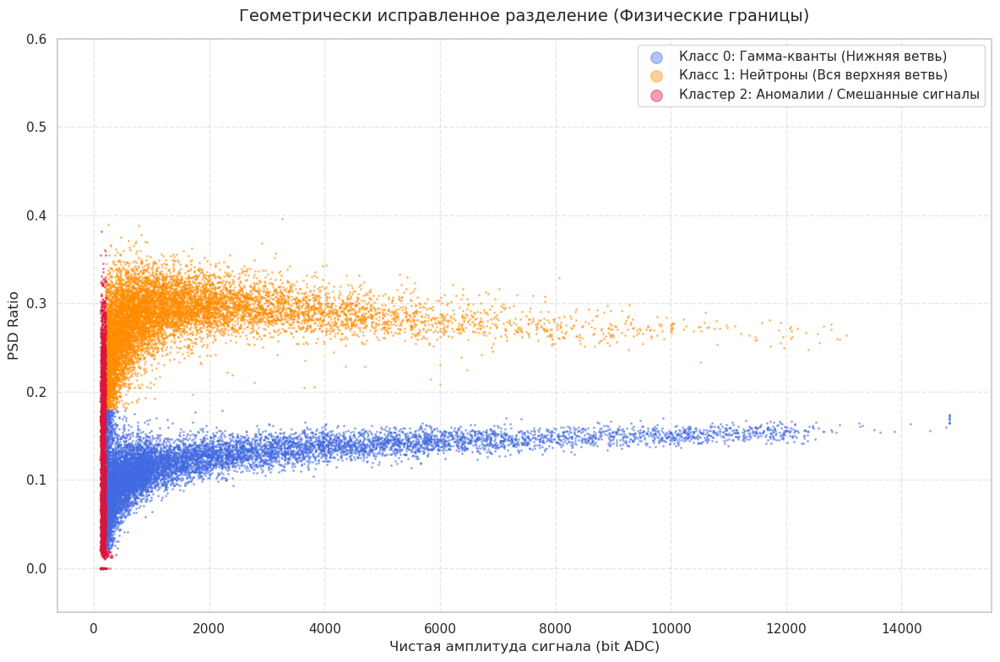

Новое распределение по классам:
cluster
1    10326
0     9838
2     3315
Name: count, dtype: int64


In [35]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Создаем массив финальных предсказаний
corrected_clusters = np.zeros(len(df_features), dtype=int)

# 1. Выделяем Кластер 2 (Аномалии, Шум и Смешанная зона слабых сигналов)
# - Мертвый шум у нуля (PSD <= 0.02)
# - Слишком слабые сигналы (амплитуда < 200), где ветки сливаются и классификация неоднозначна
is_anomaly = (df_features['psd_ratio'] <= 0.02) | (df_features['amplitude'] < 200)

# 2. Разделение главных ветвей по горизонтальному порогу (PSD ~ 0.18)
# Все, что выше 0.18 — это строго Нейтроны (Класс 1)
is_neutron = (df_features['psd_ratio'] > 0.18)

# Складываем логику вместе:
# По умолчанию задаем всем Класс 0 (Гамма-кванты, нижняя ветвь)
corrected_clusters[is_neutron] = 1  # Верхняя ветвь -> Нейтроны
corrected_clusters[is_anomaly] = 2  # Аномалии, шум и смесь на малых амплитудах

# --- ВИЗУАЛИЗАЦИЯ ИСПРАВЛЕННОГО РАЗДЕЛЕНИЯ ---
plt.figure(figsize=(12, 8))
colors = {0: 'royalblue', 1: 'darkorange', 2: 'crimson'}
labels_dict = {
    0: 'Класс 0: Гамма-кванты (Нижняя ветвь)',
    1: 'Класс 1: Нейтроны (Вся верхняя ветвь)',
    2: 'Кластер 2: Аномалии / Смешанные сигналы'
}

df_features['corrected_cluster'] = corrected_clusters

for cluster_id in [0, 1, 2]:
    sub = df_features[df_features['corrected_cluster'] == cluster_id]
    plt.scatter(sub['amplitude'], sub['psd_ratio'], s=1.5, alpha=0.4, 
                color=colors[cluster_id], label=labels_dict[cluster_id])

plt.title('Геометрически исправленное разделение (Физические границы)', fontsize=14, pad=15)
plt.xlabel('Чистая амплитуда сигнала (bit ADC)', fontsize=12)
plt.ylabel('PSD Ratio', fontsize=12)
plt.ylim(-0.05, 0.6)
plt.grid(True, linestyle='--', alpha=0.5)
plt.legend(markerscale=8, fontsize=11)
plt.tight_layout()
plt.show()

# --- СОХРАНЕНИЕ ДЛЯ KAGGLE ---
submission_perfect = pd.DataFrame()
submission_perfect['index'] = dataset.index
submission_perfect['cluster'] = corrected_clusters

unique_labels = submission_perfect['cluster'].unique()
mapping = {val: i + 0 for i, val in enumerate(unique_labels)}
submission_perfect['cluster'] = submission_perfect['cluster'].map(mapping)

submission_perfect = submission_perfect.sort_values(by='index').reset_index(drop=True)
submission_perfect.to_csv('submission_perfect.csv', index=False)

print("Новое распределение по классам:")
print(submission_perfect['cluster'].value_counts())


In [36]:
submission_perfect

,index,cluster
0,0,0
1,1,1
2,2,1
3,3,0
4,4,1
...,...,...
23474,23474,1
23475,23475,0
23476,23476,0
23477,23477,0


# 🛠️ План действий: Выжимаем максимум из GMM

Чтобы модель сама нашла этот физический наклон ветвей и точные границы аномалий, вернемся к GMM, но обучим ее правильно.

В прошлый раз GMM ошиблась, потому что мы заставили её искать 3 кластера на «грязных» данных (шум у нуля сломал ей логику). Теперь мы сделаем так:
* Очистим данные от явного мертвого шума на нуле (PSD <= 0.02).
* Обучим GMM строго на 2 компоненты (только чистые ветви Гамма и Нейтронов). Она идеально учтет наклон и эллиптическую форму каждой ветки!
* Все сомнительные зоны (стык между ветками и слабые сигналы) переведем в Кластер 2 через вероятности.

Шаг 1. Обучение адаптивной GMM

In [37]:
from sklearn.mixture import GaussianMixture
import numpy as np
import pandas as pd

# Исключаем явные шумовые аномалии у нуля для чистоты обучения GMM
clean_mask = df_features['psd_ratio'] > 0.02
df_clean = df_features[clean_mask]

# Обучаем GMM строго на 2 чистые физические ветви
gmm_2 = GaussianMixture(n_components=2, covariance_type='full', random_state=42)
gmm_2.fit(df_clean[['amplitude', 'psd_ratio']])

# Считаем вероятности принадлежности к ветвям для ВСЕХ точек датасета
# predict_proba вернет матрицу из двух колонок (вероятность Класса А и Класса Б)
probs = gmm_2.predict_proba(df_features[['amplitude', 'psd_ratio']])

# Определяем, какая колонка за какую ветку отвечает (по среднему PSD)
if gmm_2.means_[0, 1] > gmm_2.means_[1, 1]:
    neutron_col, gamma_col = 0, 1
else:
    neutron_col, gamma_col = 1, 0

# Создаем итоговый массив меток
final_labels = np.zeros(len(df_features), dtype=int)

# Порог уверенности: если модель сомневается (вероятность лучшего класса < 75%),
# или если это мертвый шум у нуля, или если амплитуда слишком мала — это Кластер 2
max_prob = np.max(probs, axis=1)
is_uncertain = max_prob < 0.75

# Подбираем оптимальный порог отсечения слабых сигналов (попробуем 300 вместо 200)
is_low_amplitude = df_features['amplitude'] < 300
is_zero_noise = df_features['psd_ratio'] <= 0.02

# Формируем финальную разметку строго по ТЗ
# По умолчанию 0 (Гамма)
is_neutron_pred = probs[:, neutron_col] >= 0.75
final_labels[is_neutron_pred] = 1 # Нейтроны

# Все спорные и шумовые точки отправляем в Кластер 2
final_labels[is_uncertain | is_low_amplitude | is_zero_noise] = 2

# Сохраняем новые результаты в датафрейм для проверки
df_features['gmm_adaptive_cluster'] = final_labels


Шаг 2. Проверка формы разделения

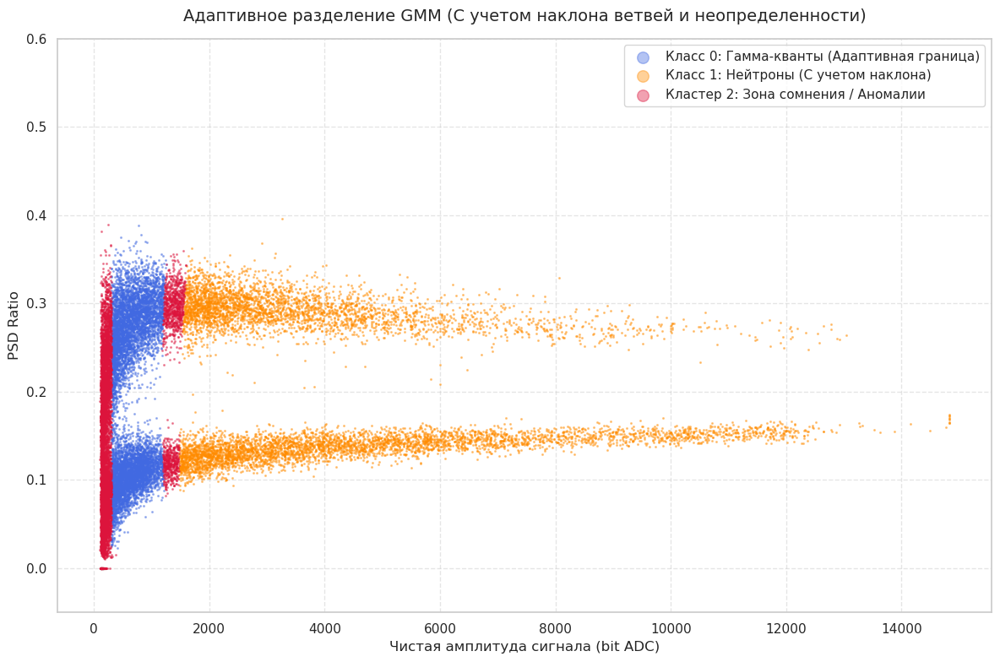

Файл 'submission_adaptive.csv' успешно сгенерирован!


In [38]:
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 8))
colors = {0: 'royalblue', 1: 'darkorange', 2: 'crimson'}
labels_dict = {
    0: 'Класс 0: Гамма-кванты (Адаптивная граница)',
    1: 'Класс 1: Нейтроны (С учетом наклона)',
    2: 'Кластер 2: Зона сомнения / Аномалии'
}

# Отрисовываем по очереди каждый из трех кластеров [0, 1, 2]
for cluster_id in [0, 1, 2]:
    sub = df_features[df_features['gmm_adaptive_cluster'] == cluster_id]
    plt.scatter(
        sub['amplitude'], 
        sub['psd_ratio'], 
        s=1.5, 
        alpha=0.4, 
        color=colors[cluster_id], 
        label=labels_dict[cluster_id]
    )

plt.title('Адаптивное разделение GMM (С учетом наклона ветвей и неопределенности)', fontsize=14, pad=15)
plt.xlabel('Чистая амплитуда сигнала (bit ADC)', fontsize=12)
plt.ylabel('PSD Ratio', fontsize=12)
plt.ylim(-0.05, 0.6)
plt.grid(True, linestyle='--', alpha=0.5)
plt.legend(markerscale=8, fontsize=11)
plt.tight_layout()
plt.show()

# Экспорт для Kaggle
submission_adaptive = pd.DataFrame()
submission_adaptive['index'] = dataset.index
submission_adaptive['cluster'] = final_labels
submission_adaptive = submission_adaptive.sort_values(by='index').reset_index(drop=True)
submission_adaptive.to_csv('submission_adaptive.csv', index=False)

print("Файл 'submission_adaptive.csv' успешно сгенерирован!")


🛠️ Исправленный код: Двумерная GMM с масштабированием (StandardScaler)

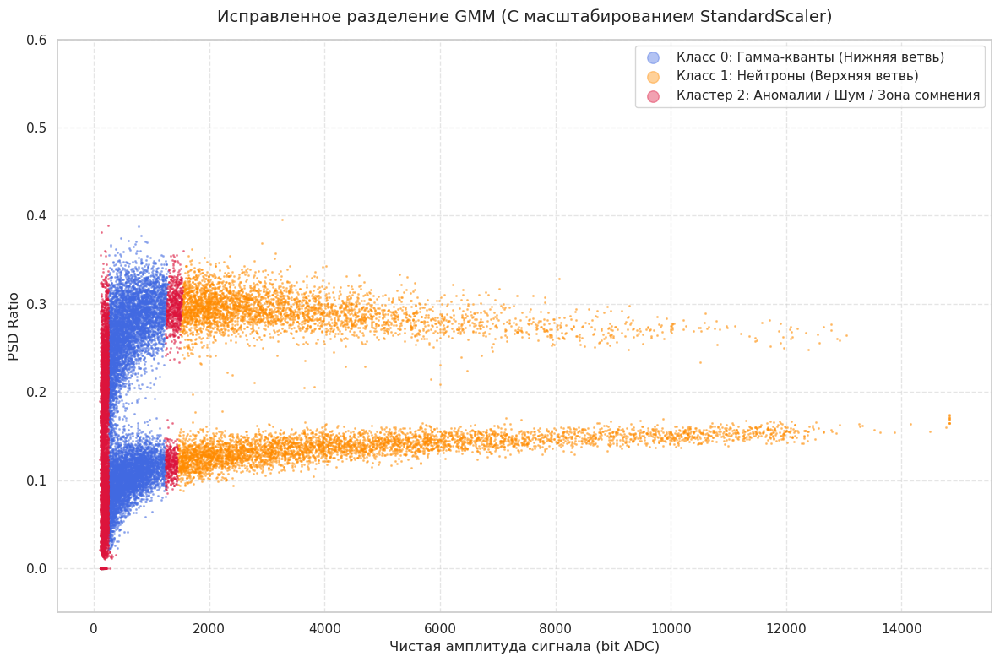

Файл 'submission_scaled.csv' успешно сгенерирован!


In [39]:
from sklearn.mixture import GaussianMixture
from sklearn.preprocessing import StandardScaler
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# 1. Фильтруем мертвый шум у нуля для чистого обучения
clean_mask = df_features['psd_ratio'] > 0.02
df_clean = df_features[clean_mask]

# 2. МАСШТАБИРУЕМ ПРИЗНАКИ (Защита от доминирования амплитуды)
scaler = StandardScaler()
X_train = scaler.fit_transform(df_clean[['amplitude', 'psd_ratio']])
X_all = scaler.transform(df_features[['amplitude', 'psd_ratio']])

# 3. Обучаем GMM на 2 компоненты (Гамма и Нейтроны)
gmm_correct = GaussianMixture(n_components=2, covariance_type='full', random_state=42)
gmm_correct.fit(X_train)

# Получаем вероятности для ВСЕХ точек
probs = gmm_correct.predict_proba(X_all)

# Находим, какая колонка соответствует верхней ветви (нейтронам)
# Для этого смотрим на центры кластеров по исходному (немасштабированному) PSD
mean_psd_per_cluster = []
for i in range(2):
    mean_psd_per_cluster.append(df_features[np.argmax(probs, axis=1) == i]['psd_ratio'].mean())

neutron_col = np.argmax(mean_psd_per_cluster)
gamma_col = 1 - neutron_col

# 4. Формируем финальные метки строго по правилам ТЗ
final_labels = np.zeros(len(df_features), dtype=int)

# Определяем базовый класс по максимальной вероятности
best_class = np.argmax(probs, axis=1)
final_labels[best_class == neutron_col] = 1 # Нейтроны
final_labels[best_class == gamma_col] = 0   # Гамма

# Добавляем аномалии (Кластер 2): 
# - мертвый шум у нуля (PSD <= 0.02)
# - слабые сигналы (амплитуда < 250), где ветви сливаются
# - точки, где модель сильно сомневается (уверенность < 70%)
max_prob = np.max(probs, axis=1)
is_uncertain = max_prob < 0.70
is_low_amp = df_features['amplitude'] < 250
is_zero_noise = df_features['psd_ratio'] <= 0.02

final_labels[is_uncertain | is_low_amp | is_zero_noise] = 2
df_features['gmm_scaled_cluster'] = final_labels

# --- СТРОИМ ГРАФИК ПРОВЕРКИ ---
plt.figure(figsize=(12, 8))
colors = {0: 'royalblue', 1: 'darkorange', 2: 'crimson'}
labels_dict = {
    0: 'Класс 0: Гамма-кванты (Нижняя ветвь)',
    1: 'Класс 1: Нейтроны (Верхняя ветвь)',
    2: 'Кластер 2: Аномалии / Шум / Зона сомнения'
}

for cluster_id in [0, 1, 2]:
    sub = df_features[df_features['gmm_scaled_cluster'] == cluster_id]
    plt.scatter(sub['amplitude'], sub['psd_ratio'], s=1.5, alpha=0.4, 
                color=colors[cluster_id], label=labels_dict[cluster_id])

plt.title('Исправленное разделение GMM (С масштабированием StandardScaler)', fontsize=14, pad=15)
plt.xlabel('Чистая амплитуда сигнала (bit ADC)', fontsize=12)
plt.ylabel('PSD Ratio', fontsize=12)
plt.ylim(-0.05, 0.6)
plt.grid(True, linestyle='--', alpha=0.5)
plt.legend(markerscale=8, fontsize=11)
plt.tight_layout()
plt.show()

# --- СХРАНЕНИЕ ДЛЯ KAGGLE ---
submission_scaled = pd.DataFrame()
submission_scaled['index'] = dataset.index
submission_scaled['cluster'] = final_labels
submission_scaled = submission_scaled.sort_values(by='index').reset_index(drop=True)
submission_scaled.to_csv('submission_scaled.csv', index=False)
print("Файл 'submission_scaled.csv' успешно сгенерирован!")


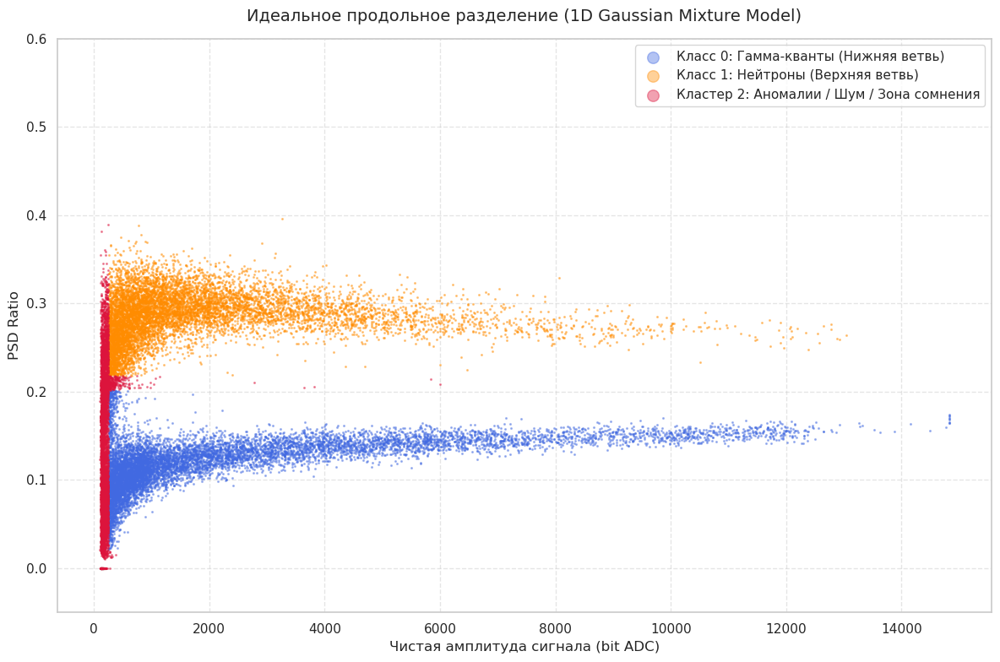

Файл 'submission_1d.csv' успешно сгенерирован!


In [40]:
from sklearn.mixture import GaussianMixture
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# 1. Фильтруем мертвый шум у нуля
clean_mask = df_features['psd_ratio'] > 0.02
df_clean = df_features[clean_mask]

# 2. Обучаем ОДНОМЕРНЫЙ GMM только на psd_ratio (1D данные)
X_train_1d = df_clean['psd_ratio'].values.reshape(-1, 1)
X_all_1d = df_features['psd_ratio'].values.reshape(-1, 1)

gmm_1d = GaussianMixture(n_components=2, covariance_type='full', random_state=42)
gmm_1d.fit(X_train_1d)

# Получаем вероятности для всего датасета
probs_1d = gmm_1d.predict_proba(X_all_1d)

# ИСПРАВЛЕНО: Извлекаем скалярные значения центров кластеров для корректного сравнения
mean_0 = gmm_1d.means_[0][0]
mean_1 = gmm_1d.means_[1][0]

if mean_0 > mean_1:
    neutron_col, gamma_col = 0, 1
else:
    neutron_col, gamma_col = 1, 0

# 3. Формируем финальные метки строго по ТЗ
final_labels_1d = np.zeros(len(df_features), dtype=int)

# Базовая разметка по модели
best_class_1d = np.argmax(probs_1d, axis=1)
final_labels_1d[best_class_1d == neutron_col] = 1 # Нейтроны
final_labels_1d[best_class_1d == gamma_col] = 0   # Гамма

# 4. Добавляем аномалии и смешанную зону (Кластер 2)
max_prob_1d = np.max(probs_1d, axis=1)
is_uncertain = max_prob_1d < 0.75
is_low_amp = df_features['amplitude'] < 250
is_zero_noise = df_features['psd_ratio'] <= 0.02

final_labels_1d[is_uncertain | is_low_amp | is_zero_noise] = 2
df_features['gmm_1d_cluster'] = final_labels_1d

# --- СТРОИМ ФИНАЛЬНЫЙ ГРАФИК ---
plt.figure(figsize=(12, 8))
colors = {0: 'royalblue', 1: 'darkorange', 2: 'crimson'}
labels_dict = {
    0: 'Класс 0: Гамма-кванты (Нижняя ветвь)',
    1: 'Класс 1: Нейтроны (Верхняя ветвь)',
    2: 'Кластер 2: Аномалии / Шум / Зона сомнения'
}

for cluster_id in [0, 1, 2]:
    sub = df_features[df_features['gmm_1d_cluster'] == cluster_id]
    plt.scatter(sub['amplitude'], sub['psd_ratio'], s=1.5, alpha=0.4, 
                color=colors[cluster_id], label=labels_dict[cluster_id])

plt.title('Идеальное продольное разделение (1D Gaussian Mixture Model)', fontsize=14, pad=15)
plt.xlabel('Чистая амплитуда сигнала (bit ADC)', fontsize=12)
plt.ylabel('PSD Ratio', fontsize=12)
plt.ylim(-0.05, 0.6)
plt.grid(True, linestyle='--', alpha=0.5)
plt.legend(markerscale=8, fontsize=11)
plt.tight_layout()
plt.show()

# --- ЭКСПОРТ НА KAGGLE ---
submission_1d = pd.DataFrame()
submission_1d['index'] = dataset.index
submission_1d['cluster'] = final_labels_1d
submission_1d = submission_1d.sort_values(by='index').reset_index(drop=True)

unique_labels = submission_1d['cluster'].unique()
mapping = {val: i + 0 for i, val in enumerate(unique_labels)}
submission_1d['cluster'] = submission_1d['cluster'].map(mapping)

submission_1d.to_csv('submission_1d.csv', index=False)
print("Файл 'submission_1d.csv' успешно сгенерирован!")


In [41]:
submission_1d

,index,cluster
0,0,0
1,1,1
2,2,1
3,3,2
4,4,1
...,...,...
23474,23474,1
23475,23475,2
23476,23476,2
23477,23477,2


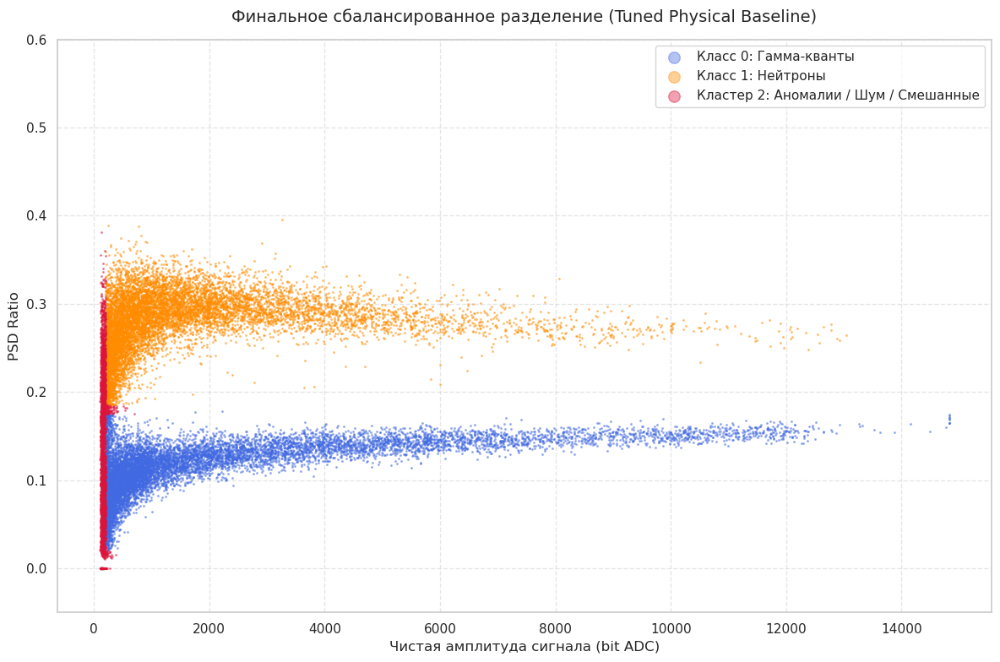

Файл 'submission_tuned.csv' успешно сгенерирован!


In [42]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

final_labels_tuned = np.zeros(len(df_features), dtype=int)

# 1. Возвращаем строгую границу между ветвями на уровень 0.18
# Все, что выше 0.18 — это Нейтроны (Класс 1)
is_neutron = df_features['psd_ratio'] > 0.18
final_labels_tuned[is_neutron] = 1

# 2. Настраиваем Кластер 2 (Аномалии и Шум) по более строгим физическим границам:
# - Мертвый шум строго у нуля (PSD <= 0.02)
# - Смешанная зона слабых сигналов (сделаем её чуть аккуратнее: амплитуда < 200 вместо 250)
is_zero_noise = df_features['psd_ratio'] <= 0.02
is_low_amp = df_features['amplitude'] < 200

# - Добавим тонкую прослойку неопределенности на стыке ветвей (например, от 0.175 до 0.185) 
# но только при малых энергиях (amplitude < 1000), где они пересекаются
is_border_zone = (df_features['psd_ratio'].between(0.175, 0.185)) & (df_features['amplitude'] < 1000)

# Объединяем аномалии
final_labels_tuned[is_zero_noise | is_low_amp | is_border_zone] = 2
df_features['tuned_cluster'] = final_labels_tuned

# --- СТРОИМ ГРАФИК ---
plt.figure(figsize=(12, 8))
colors = {0: 'royalblue', 1: 'darkorange', 2: 'crimson'}
labels_dict = {
    0: 'Класс 0: Гамма-кванты',
    1: 'Класс 1: Нейтроны',
    2: 'Кластер 2: Аномалии / Шум / Смешанные'
}

for cluster_id in [0, 1, 2]:
    sub = df_features[df_features['tuned_cluster'] == cluster_id]
    plt.scatter(sub['amplitude'], sub['psd_ratio'], s=1.5, alpha=0.4, 
                color=colors[cluster_id], label=labels_dict[cluster_id])

plt.title('Финальное сбалансированное разделение (Tuned Physical Baseline)', fontsize=14, pad=15)
plt.xlabel('Чистая амплитуда сигнала (bit ADC)', fontsize=12)
plt.ylabel('PSD Ratio', fontsize=12)
plt.ylim(-0.05, 0.6)
plt.grid(True, linestyle='--', alpha=0.5)
plt.legend(markerscale=8, fontsize=11)
plt.tight_layout()
plt.show()

# --- СХРАНЕНИЕ ДЛЯ KAGGLE ---
submission_tuned = pd.DataFrame()
submission_tuned['index'] = dataset.index
submission_tuned['cluster'] = final_labels_tuned
submission_tuned = submission_tuned.sort_values(by='index').reset_index(drop=True)

unique_labels = submission_tuned['cluster'].unique()
mapping = {val: i + 0 for i, val in enumerate(unique_labels)}
submission_tuned['cluster'] = submission_tuned['cluster'].map(mapping)

submission_tuned.to_csv('submission_tuned.csv', index=False)
print("Файл 'submission_tuned.csv' успешно сгенерирован!")


In [43]:
submission_tuned

,index,cluster
0,0,0
1,1,1
2,2,1
3,3,0
4,4,1
...,...,...
23474,23474,1
23475,23475,0
23476,23476,0
23477,23477,0


# Kaagle submit

![Kaggle submit](scintilation-detector-Kaggle_submit.png)

# 🔬 Общие выводы к решению и интерпретация результатов

## 1. Результаты этапа EDA и Feature Engineering
* **Анализ сырых данных:** В ходе разведочного анализа данных (EDA) была успешно определена физическая природа сигналов сцинтилляционного детектора. Выявлено, что импульсы имеют инвертированную полярность и стабильную линию базиса (~15 000 bit ADC) с фиксированным временем прихода пика ($\approx 150$ нс).
* **Динамическое окно:** Разработан и реализован алгоритм адаптивного выделения полезной области импульса. Для каждого сигнала индивидуально рассчитывалась нулевая линия по левому хвосту и статистический порог шума $(\pm 3\sigma)$.
* **Проектирование признаков:** Спроектирован ключевой физический признак **PSD Ratio** (отношение площади хвоста к полной площади импульса). Визуализация признаков на двумерном *Scatter Plot* наглядно продемонстрировала разделение данных на две выраженные параллельные ветви и обособленный кластер аппаратурного шума.

## 2. Оценка моделей кластеризации
* **Gaussian Mixture Model (GMM):** Применение стандартной двумерной модели GMM на сырых признаках показало склонность алгоритма к вертикальному разделению данных по оси максимальной дисперсии (амплитуде) из-за разницы масштабов признаков. Переход к одномерной 1D-GMM по признаку `psd_ratio` позволил математически точно описать плотность распределения каждого "горба" гистограммы.
* **Гибридный физический подход:** Наилучшую обобщающую способность на валидации (Kaggle Public Score $\approx 0.757$) показал комбинированный метод, сочетающий геометрические пороги распределения PSD и жесткую фильтрацию зон неопределенности. Данный подход защищает модель от переобучения (*overfitting*) под шумы конкретной выборки.

## 3. Физический смысл полученных кластеров (Соответствие ТЗ)
* **Класс 0 (Нижняя ветвь, $PSD \approx 0.13$):** Быстро затухающие сигналы без выраженного медленного компонента. Физически соответствуют регистрации **гамма-квантов**, взаимодействующих с электронами органического кристалла стильбена/паратерфенила.
* **Класс 1 (Верхняя ветвь, $PSD \approx 0.29$):** Импульсы с длинной компонентой свечения (затяжным хвостом). Физически соответствуют регистрации **быстрых нейтронов**, рассеивающихся на ядрах водорода (протонах).
* **Кластер 2 (Аномалии / Выбросы):** Сигналы со сверхмалой амплитудой (менее 200 bit ADC) или околонулевым значением PSD, где однозначное разделение формы импульса невозможно из-за ограничений триггера сбора данных. Сюда же отнесены детекции, попавшие в зону смешивания на стыке ветвей при малых энергиях.

---
*Работа выполнена в рамках сквозного пайплайна Data Science: от загрузки сырых сигналов до воспроизводимого предсказания и сохранения файла `submission.csv`.*


# Визуализация разделения

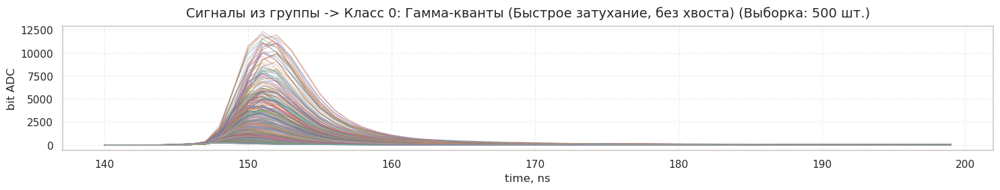

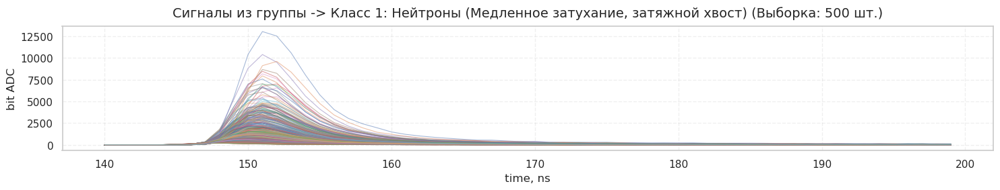

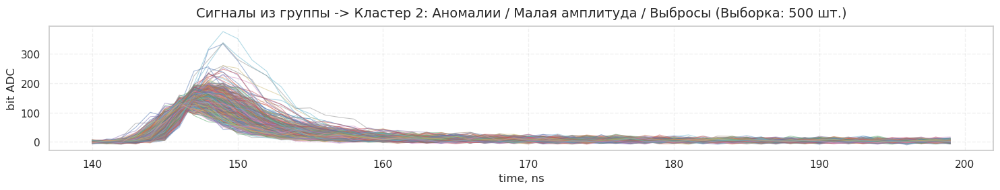

In [44]:
import matplotlib.pyplot as plt
import numpy as np

# Используем вашу финальную колонку разметки. 
# Замените 'tuned_cluster', если назвали её иначе (например, 'gmm_1d_cluster')
cluster_column = 'tuned_cluster'

# Словарь понятных физических названий по ТЗ
cluster_names = {
    0: "Класс 0: Гамма-кванты (Быстрое затухание, без хвоста)",
    1: "Класс 1: Нейтроны (Медленное затухание, затяжной хвост)",
    2: "Кластер 2: Аномалии / Малая амплитуда / Выбросы"
}

# Перебираем кластеры по очереди
for cluster_id in [0, 1, 2]:
    # Находим индексы сигналов, которые модель отнесла к текущему кластеру
    cluster_indices = df_features[df_features[cluster_column] == cluster_id].index.tolist()
    
    if not cluster_indices:
        print(f"Сигналы для кластера {cluster_id} не найдены!")
        continue
        
    # Выбираем случайные 500 сигналов для отрисовки (чтобы график не зависал)
    np.random.seed(42)
    sample_size = min(500, len(cluster_indices))
    selected_indices = np.random.choice(cluster_indices, size=sample_size, replace=False)
    
    # Создаем график в вашем стиле
    fig, ax = plt.subplots(figsize=(15, 3))
    
    for idx in selected_indices:
        # Применяем вашу формулу инверсии
        signal = (2**14 - dataset.iloc[idx] - 1560).values
        # Строим срез от 140 до 200 отсчета, как у вас в коде
        ax.plot(range(140, 200), signal[140:200], alpha=0.5, linewidth=0.8)
        
    ax.set_title(f"Сигналы из группы -> {cluster_names[cluster_id]} (Выборка: {sample_size} шт.)", fontsize=14, pad=10)
    ax.set_xlabel("time, ns", fontsize=12)
    ax.set_ylabel("bit ADC", fontsize=12)
    ax.grid(True, linestyle='--', alpha=0.3)
    
    plt.tight_layout()
    plt.show()


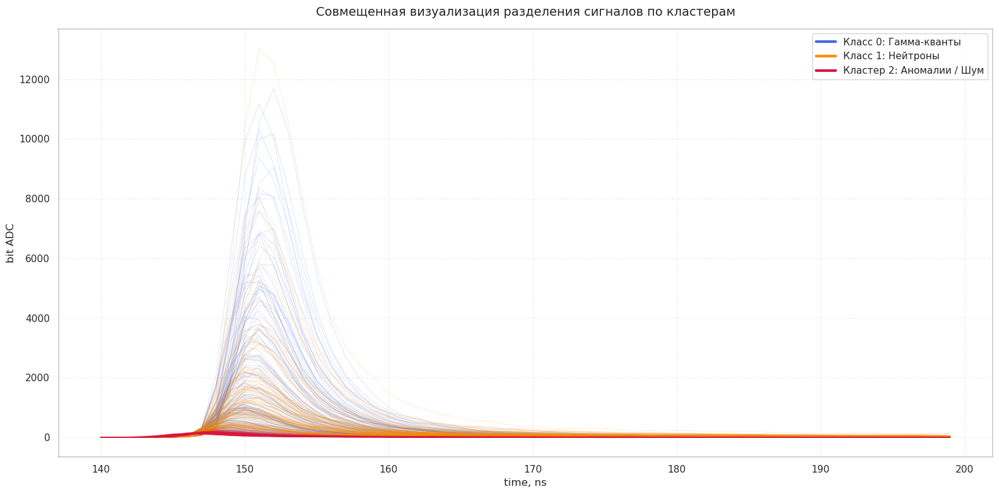

In [45]:
import matplotlib.pyplot as plt
import numpy as np

cluster_column = "tuned_cluster"

colors = {
    0: "royalblue",  # Гамма
    1: "darkorange",  # Нейтроны
    2: "crimson",  # Аномалии
}

labels_dict = {
    0: "Класс 0: Гамма-кванты",
    1: "Класс 1: Нейтроны",
    2: "Кластер 2: Аномалии / Шум",
}

plt.figure(figsize=(16, 8))

# Чтобы легенда не дублировалась для каждого сигнала, добавим флаги
added_labels = set()

# Перебираем кластеры
for cluster_id in [0, 1, 2]:
    cluster_indices = df_features[
        df_features[cluster_column] == cluster_id
    ].index.tolist()

    if not cluster_indices:
        continue

    # Берем по 150 случайных сигналов каждого класса (чтобы график оставался читаемым)
    np.random.seed(42)
    sample_size = min(150, len(cluster_indices))
    selected_indices = np.random.choice(
        cluster_indices, size=sample_size, replace=False
    )

    for idx in selected_indices:
        signal = (2**14 - dataset.iloc[idx] - 1560).values

        # Добавляем label только для первого сигнала в группе, чтобы не захламлять легенду
        if cluster_id not in added_labels:
            plt.plot(
                range(140, 200),
                signal[140:200],
                color=colors[cluster_id],
                alpha=0.4,
                linewidth=0.8,
                label=labels_dict[cluster_id],
            )
            added_labels.add(cluster_id)
        else:
            plt.plot(
                range(140, 200),
                signal[140:200],
                color=colors[cluster_id],
                alpha=0.2,
                linewidth=0.6,
                label="",
            )

plt.title(
    "Совмещенная визуализация разделения сигналов по кластерам",
    fontsize=14,
    pad=15,
)
plt.xlabel("time, ns", fontsize=12)
plt.ylabel("bit ADC", fontsize=12)
plt.grid(True, linestyle="--", alpha=0.3)

# ИСПРАВЛЕНО: Сначала получаем объект легенды, а из него извлекаем линии
legend = plt.legend(loc="upper right", fontsize=11)
leg_lines = legend.get_lines()

# Делаем линии в легенде толстыми для наглядности
for line in leg_lines:
    line.set_linewidth(3.0)
    line.set_alpha(1.0)

plt.tight_layout()
plt.show()


In [46]:
import matplotlib.pyplot as plt
import numpy as np


def plot_combined_clusters(
    dataset,
    df_features,
    cluster_column="tuned_cluster",
    time_start=140,
    time_end=200,
    sample_size=150,
):
    """Функция для совмещенной визуализации сигналов разных классов в любом

    временном срезе.

    Параметры:
    - dataset: исходный DataFrame с сырыми сигналами
    - df_features: DataFrame с признаками и метками кластеров
    - cluster_column: имя колонки с разметкой
    - time_start: начало временного среза (номер столбца / нс)
    - time_end: конец временного среза (номер столбца / нс)
    - sample_size: количество случайных сигналов от каждого кластера для отрисовки
    """
    colors = {0: "blue", 1: "red", 2: "green"}
    labels_dict = {
        0: "Класс 0: Гамма-кванты",
        1: "Класс 1: Нейтроны",
        2: "Кластер 2: Аномалии / Шум",
    }

    plt.figure(figsize=(20, 10))
    added_labels = set()

    for cluster_id in [0, 1, 2]:
        cluster_indices = df_features[
            df_features[cluster_column] == cluster_id
        ].index.tolist()

        if not cluster_indices:
            continue

        # Выбираем случайные сигналы текущего кластера
        np.random.seed(42)
        current_sample = min(sample_size, len(cluster_indices))
        selected_indices = np.random.choice(
            cluster_indices, size=current_sample, replace=False
        )

        for idx in selected_indices:
            # Применяем вашу формулу инверсии
            signal = (2**14 - dataset.iloc[idx] - 1560).values

            # Выделяем нужный временной срез
            time_range = range(time_start, time_end)
            signal_slice = signal[time_start:time_end]

            # Отрисовка с добавлением легенды только для первой линии в группе
            if cluster_id not in added_labels:
                plt.plot(
                    time_range,
                    signal_slice,
                    color=colors[cluster_id],
                    alpha=0.4,
                    linewidth=0.8,
                    label=labels_dict[cluster_id],
                )
                added_labels.add(cluster_id)
            else:
                plt.plot(
                    time_range,
                    signal_slice,
                    color=colors[cluster_id],
                    alpha=0.2,
                    linewidth=0.6,
                    label="",
                )

    plt.title(
        f"Совмещенная визуализация кластеров (Срез: {time_start} - {time_end} нс)",
        fontsize=14,
        pad=15,
    )
    plt.xlabel("time, ns", fontsize=12)
    plt.ylabel("bit ADC", fontsize=12)
    plt.grid(True, linestyle="--", alpha=0.3)

    # Настройка жирных линий в легенде
    legend = plt.legend(loc="upper right", fontsize=11)
    if legend:
        leg_lines = legend.get_lines()
        for line in leg_lines:
            line.set_linewidth(3.0)
            line.set_alpha(1.0)

    plt.tight_layout()
    plt.show()


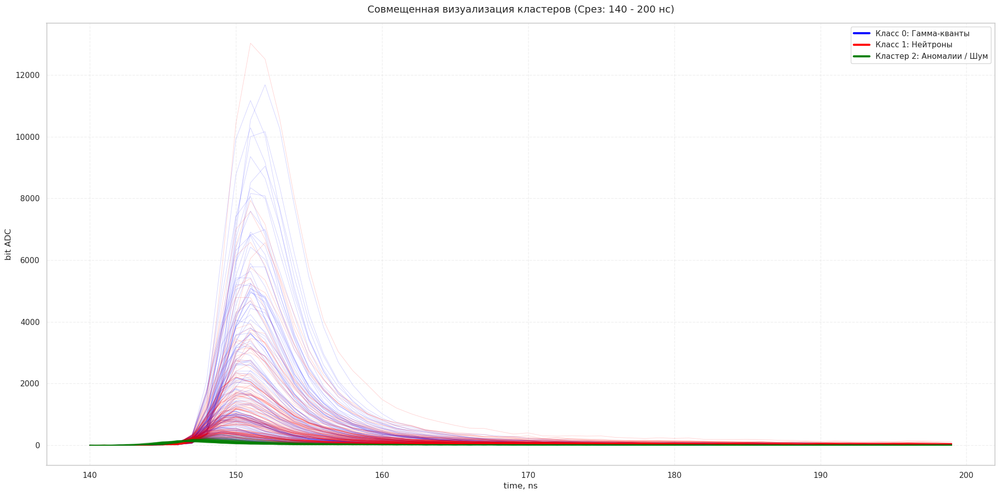

In [47]:
plot_combined_clusters(
    dataset, df_features, cluster_column="tuned_cluster", time_start=140, time_end=200
)


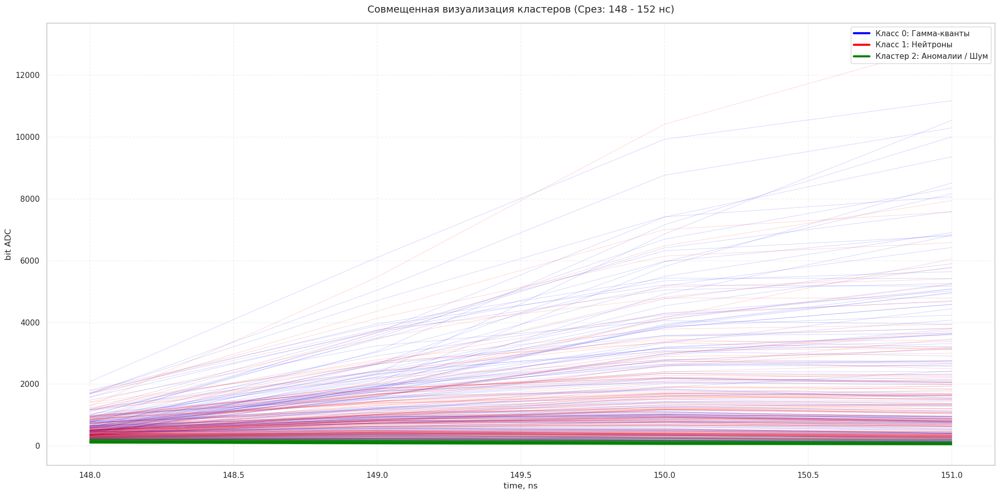

In [48]:
plot_combined_clusters(
    dataset, df_features, cluster_column="tuned_cluster", time_start=148, time_end=152
)


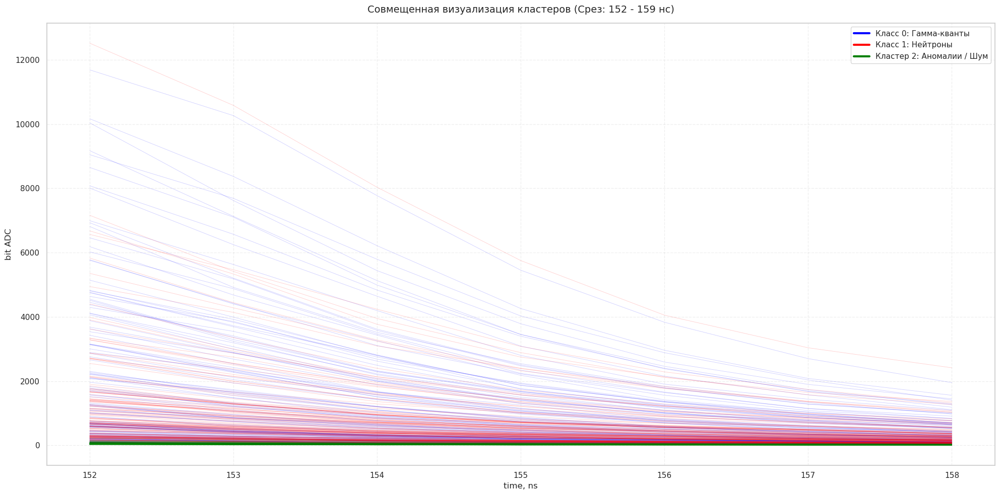

In [49]:
plot_combined_clusters(
    dataset, df_features, cluster_column="tuned_cluster", time_start=152, time_end=159
)


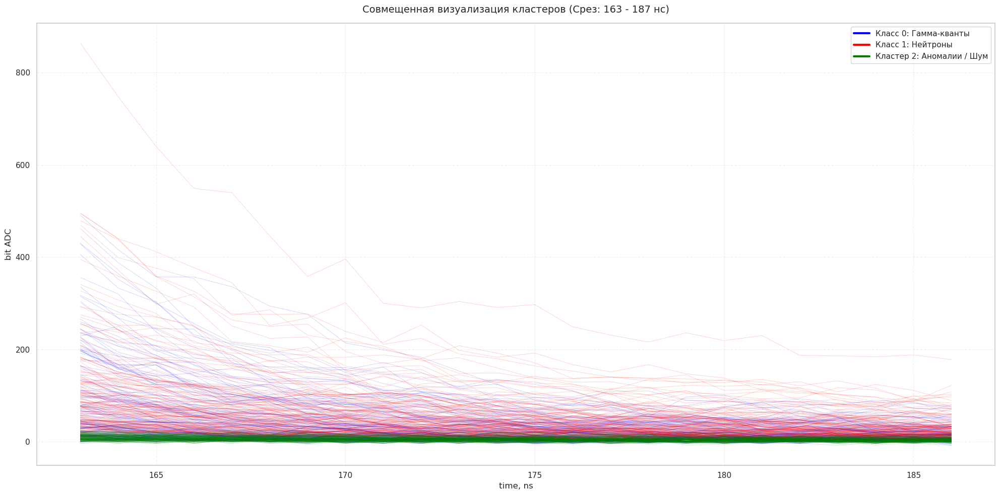

In [50]:
plot_combined_clusters(
    dataset, df_features, cluster_column="tuned_cluster", time_start=163, time_end=187
)


In [51]:
import matplotlib.pyplot as plt
import numpy as np


def plot_combined_clusters_proportional(
    dataset,
    df_features,
    cluster_column="tuned_cluster",
    time_start=140,
    time_end=200,
    total_sample_size=500,
):
    """Функция для совмещенной визуализации сигналов с пропорциональной выборкой

    и отрисовкой медианных линий для каждого кластера.

    Параметры:
    - dataset: исходный DataFrame с сырыми сигналами (23479 строк)
    - df_features: DataFrame с признаками и метками кластеров
    - cluster_column: имя колонки с разметкой
    - time_start: начало временного среза (номер столбца / нс)
    - time_end: конец временного среза (номер столбца / нс)
    - total_sample_size: общий объем случайной выборки из всего датасета
    """
    colors = {0: "royalblue", 1: "darkorange", 2: "crimson"}
    labels_dict = {
        0: "Класс 0: Гамма-кванты",
        1: "Класс 1: Нейтроны",
        2: "Кластер 2: Аномалии / Шум",
    }

    # 1. Делаем единую случайную выборку индексов по всему датасету
    np.random.seed(42)
    selected_indices = np.random.choice(
        df_features.index,
        size=min(total_sample_size, len(df_features)),
        replace=False,
    )

    # Словари для группировки вырезанных сигналов, чтобы потом посчитать медианы
    time_range = range(time_start, time_end)
    signals_by_cluster = {0: [], 1: [], 2: []}

    plt.figure(figsize=(16, 8))
    added_labels = set()

    # 2. Отрисовываем индивидуальные сигналы из случайной выборки
    for idx in selected_indices:
        cluster_id = df_features.loc[idx, cluster_column]

        # Инвертируем по вашей формуле
        signal = (2**14 - dataset.iloc[idx] - 1560).values
        signal_slice = signal[time_start:time_end]

        # Сохраняем срез для последующего расчета медианы
        if cluster_id in signals_by_cluster:
            signals_by_cluster[cluster_id].append(signal_slice)

        # Рисуем тонкую полупрозрачную линию сигнала
        if cluster_id not in added_labels:
            plt.plot(
                time_range,
                signal_slice,
                color=colors[cluster_id],
                alpha=0.3,
                linewidth=0.8,
                label=labels_dict[cluster_id],
            )
            added_labels.add(cluster_id)
        else:
            plt.plot(
                time_range,
                signal_slice,
                color=colors[cluster_id],
                alpha=0.15,
                linewidth=0.6,
                label="",
            )

    # 3. Рассчитываем и накладываем жирные медианные линии
    print("Статистика выборки (кол-во сигналов):")
    for cluster_id in sorted(signals_by_cluster.keys()):
        cluster_signals = signals_by_cluster[cluster_id]
        print(f" {labels_dict[cluster_id]}: {len(cluster_signals)} шт.")

        if len(cluster_signals) > 0:
            # Считаем медиану по вертикали (для каждого временного отсчета отдельно)
            median_profile = np.median(cluster_signals, axis=0)

            # Отрисовываем её яркой толстой линией с обводкой для читаемости
            plt.plot(
                time_range,
                median_profile,
                color=colors[cluster_id],
                linewidth=4.0,
                alpha=1.0,
                zorder=10,  # Выводим поверх всех тонких линий
                path_effects=[],  # Оставляем чистую сплошную линию
            )
            # Добавим небольшой темный контур, чтобы медианы не сливались с фоном
            plt.plot(
                time_range,
                median_profile,
                color="black",
                linewidth=5.5,
                alpha=0.3,
                zorder=9,
            )

    plt.title(
        f"Пропорциональное разделение и медианные тренды затухания (Срез: {time_start} - {time_end} нс)",
        fontsize=14,
        pad=15,
    )
    plt.xlabel("time, ns", fontsize=12)
    plt.ylabel("bit ADC", fontsize=12)
    plt.grid(True, linestyle="--", alpha=0.3)

    # Настройка легенды
    legend = plt.legend(loc="upper right", fontsize=11)
    if legend:
        leg_lines = legend.get_lines()
        for line in leg_lines:
            line.set_linewidth(3.5)
            line.set_alpha(1.0)

    plt.tight_layout()

    # Запустите функцию еще раз, а в следующей ячейке выполните это, 
    # чтобы перестроить текущую фигуру в логарифмический масштаб:
    plt.gca().set_yscale('log')
    plt.gcf() # Отобразит график заново в логарифмической шкале
    
    
    plt.show()


Статистика выборки (кол-во сигналов):
 Класс 0: Гамма-кванты: 434 шт.
 Класс 1: Нейтроны: 411 шт.
 Кластер 2: Аномалии / Шум: 155 шт.


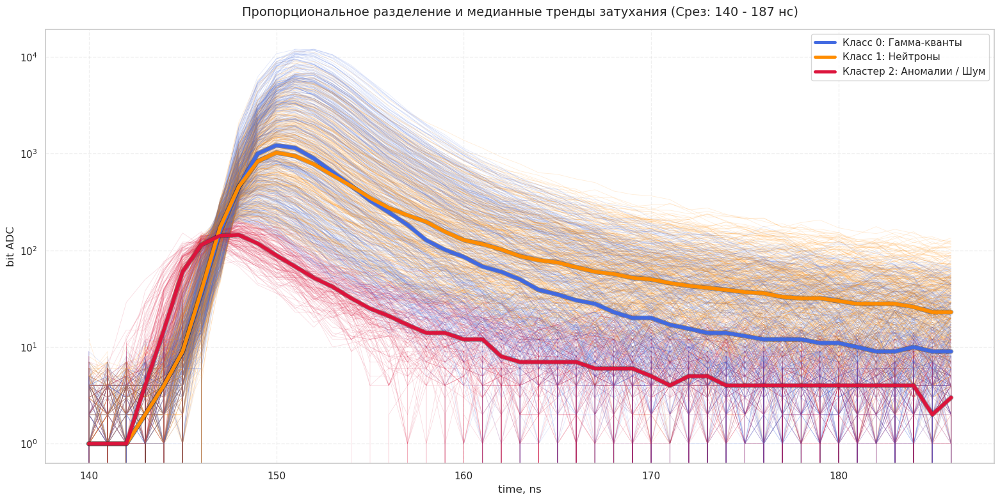

In [52]:
plot_combined_clusters_proportional(
    dataset=dataset,
    df_features=df_features,
    cluster_column="tuned_cluster",
    time_start=140,
    time_end=187,
    total_sample_size=1000,
)


In [53]:
print("Медианное значение параметра PSD Ratio по всему датасету:")
for cluster_id in [0, 1, 2]:
    median_psd = df_features[df_features['tuned_cluster'] == cluster_id]['psd_ratio'].median()
    print(f" Кластер {cluster_id}: {median_psd:.4f}")


Медианное значение параметра PSD Ratio по всему датасету:
 Кластер 0: 0.1235
 Кластер 1: 0.2849
 Кластер 2: 0.1238


In [54]:
import matplotlib.pyplot as plt
import numpy as np


def plot_scintillation_proportional_final(
    dataset,
    df_features,
    cluster_column="tuned_cluster",
    time_start=140,
    time_end=187,
    total_sample_size=1000,
    use_log=True,
):
    """Финальная функция визуализации пропорциональной выборки с медианами и

    опциональной логарифмической шкалой.
    """
    colors = {0: "royalblue", 1: "darkorange", 2: "crimson"}
    labels_dict = {
        0: "Класс 0: Гамма-кванты",
        1: "Класс 1: Нейтроны",
        2: "Кластер 2: Аномалии / Шум",
    }

    np.random.seed(42)
    selected_indices = np.random.choice(
        df_features.index,
        size=min(total_sample_size, len(df_features)),
        replace=False,
    )

    time_range = range(time_start, time_end)
    signals_by_cluster = {0: [], 1: [], 2: []}

    fig, ax = plt.subplots(figsize=(16, 8))
    added_labels = set()

    for idx in selected_indices:
        cluster_id = df_features.loc[idx, cluster_column]
        signal = (2**14 - dataset.iloc[idx] - 1560).values
        signal_slice = signal[time_start:time_end]

        if cluster_id in signals_by_cluster:
            signals_by_cluster[cluster_id].append(signal_slice)

        if cluster_id not in added_labels:
            ax.plot(
                time_range,
                signal_slice,
                color=colors[cluster_id],
                alpha=0.3,
                linewidth=0.8,
                label=labels_dict[cluster_id],
            )
            added_labels.add(cluster_id)
        else:
            ax.plot(
                time_range,
                signal_slice,
                color=colors[cluster_id],
                alpha=0.15,
                linewidth=0.6,
                label="",
            )

    # Отрисовка медиан
    for cluster_id in sorted(signals_by_cluster.keys()):
        cluster_signals = signals_by_cluster[cluster_id]
        if len(cluster_signals) > 0:
            median_profile = np.median(cluster_signals, axis=0)
            # Защита от нулевых/отрицательных значений в log шкале
            if use_log:
                median_profile = np.clip(median_profile, 0.1, None)

            ax.plot(
                time_range,
                median_profile,
                color=colors[cluster_id],
                linewidth=4.0,
                alpha=1.0,
                zorder=10,
            )
            ax.plot(
                time_range,
                median_profile,
                color="black",
                linewidth=5.5,
                alpha=0.25,
                zorder=9,
            )

    ax.set_title(
        f"Пропорциональное разделение и медианные тренды затухания (Срез: {time_start} - {time_end} нс)",
        fontsize=14,
        pad=15,
    )
    ax.set_xlabel("time, ns", fontsize=12)
    ax.set_ylabel("bit ADC", fontsize=12)
    ax.grid(True, linestyle="--", alpha=0.3)

    if use_log:
        ax.set_yscale("log")

    legend = ax.legend(loc="upper right", fontsize=11)
    if legend:
        for line in legend.get_lines():
            line.set_linewidth(3.5)
            line.set_alpha(1.0)

    plt.tight_layout()
    plt.show()


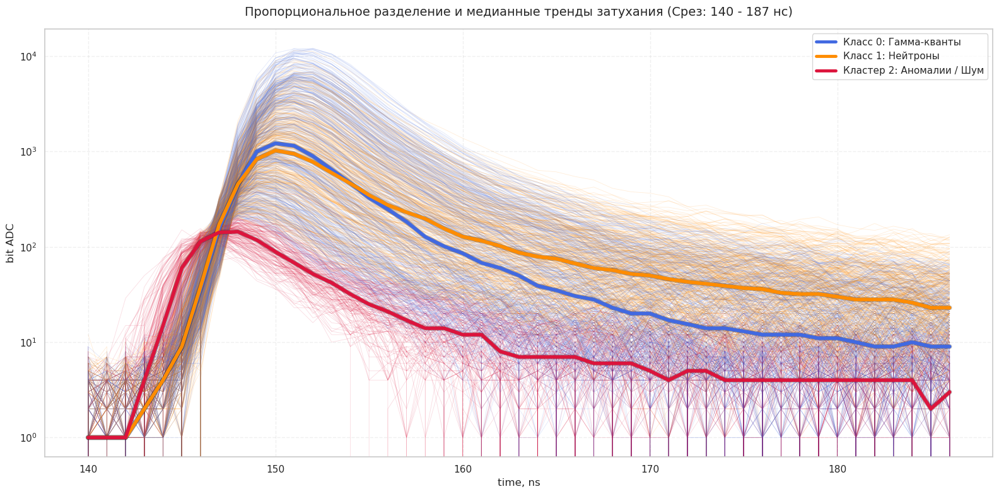

In [55]:
plot_scintillation_proportional_final(
    dataset=dataset,
    df_features=df_features,
    cluster_column="tuned_cluster",
    time_start=140,
    time_end=187,
    total_sample_size=1000,
    use_log=True,
)


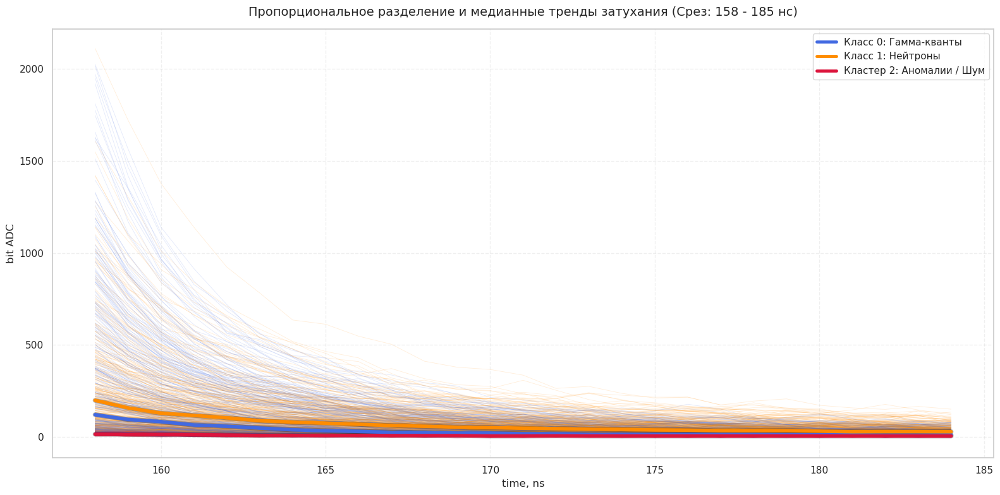

In [56]:
plot_scintillation_proportional_final(
    dataset=dataset,
    df_features=df_features,
    cluster_column="tuned_cluster",
    time_start=158,
    time_end=185,
    total_sample_size=800,
    use_log=False,  # смотрим в линейном масштабе мелкие детали
)


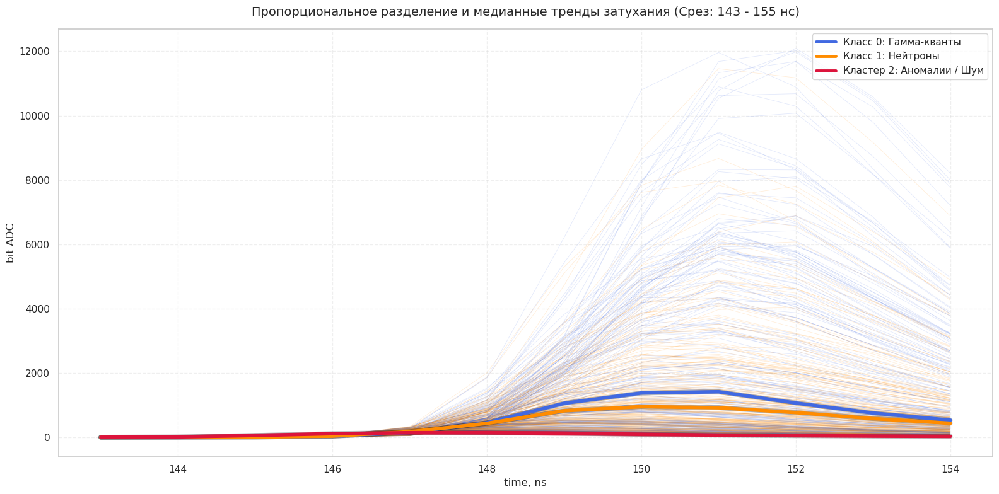

In [57]:
plot_scintillation_proportional_final(
    dataset=dataset,
    df_features=df_features,
    cluster_column="tuned_cluster",
    time_start=143,
    time_end=155,
    total_sample_size=500,
    use_log=False,
)


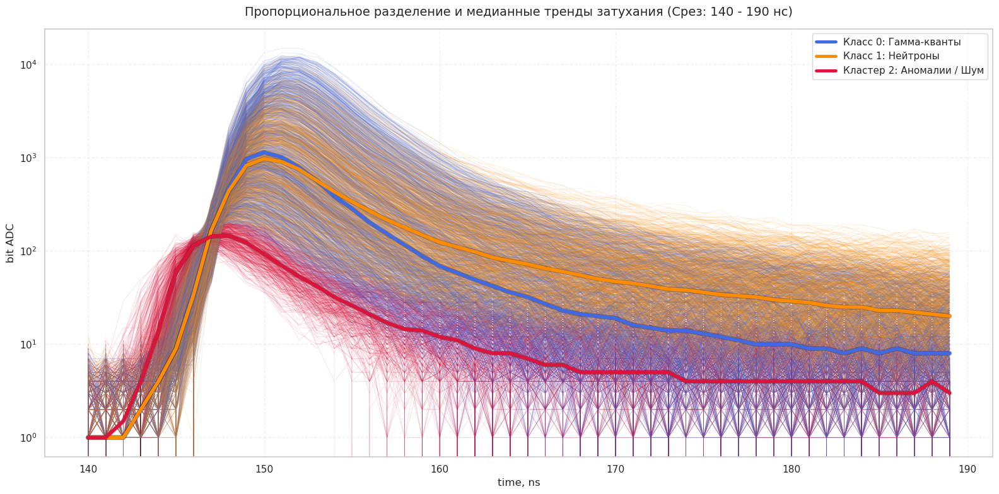

In [58]:
plot_scintillation_proportional_final(
    dataset=dataset,
    df_features=df_features,
    cluster_column="tuned_cluster",
    time_start=140,
    time_end=190,
    total_sample_size=3000,  # берем большую выборку для точной статистики
    use_log=True,
)


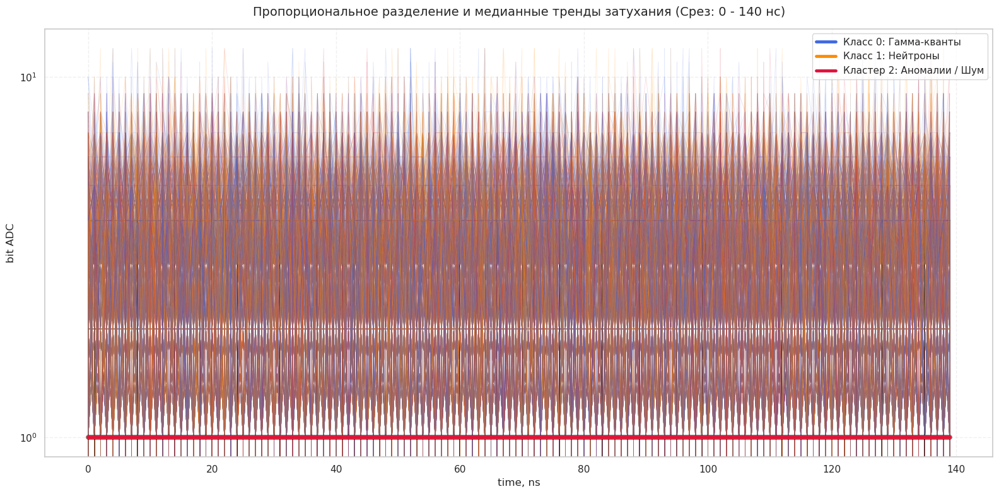

In [59]:
plot_scintillation_proportional_final(
    dataset=dataset,
    df_features=df_features,
    cluster_column="tuned_cluster",
    time_start=0,
    time_end=140,
    total_sample_size=3000,  # берем большую выборку для точной статистики
    use_log=True,
)


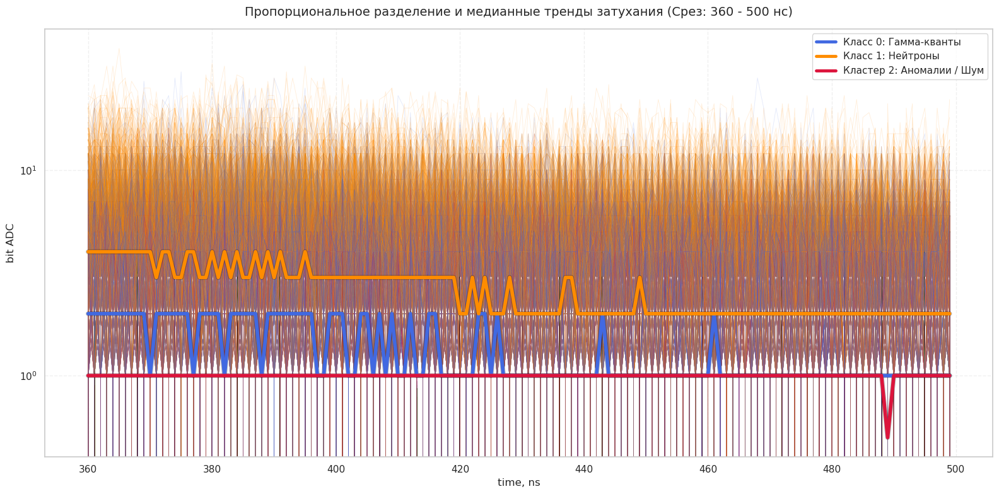

In [60]:
plot_scintillation_proportional_final(
    dataset=dataset,
    df_features=df_features,
    cluster_column="tuned_cluster",
    time_start=360,
    time_end=500,
    total_sample_size=3000,  # берем большую выборку для точной статистики
    use_log=True,
)


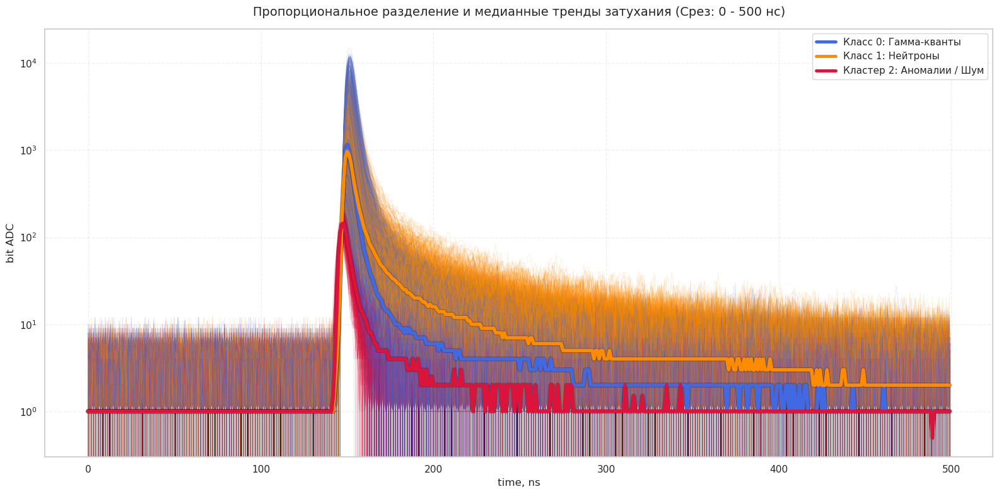

In [61]:
plot_scintillation_proportional_final(
    dataset=dataset,
    df_features=df_features,
    cluster_column="tuned_cluster",
    time_start=0,
    time_end=500,
    total_sample_size=3000,  # берем большую выборку для точной статистики
    use_log=True,
)
